In [138]:
import csv
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import math
import numpy as np
import sklearn.cluster as skclust 
import copy

def load_all_fitnesses(filename,obj) :
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        best_fitnesses = []
        best_ind_id = []
        avg_fitnesses = []
        pop_size= []
        nb_eval = []
        nb_eval_tot = 0
        for row in csv_data :
            best_fitness = 0
            best_id = 0
            avg_fitness = 0
            nb_eval_tot += int(row[1])
            for i in range(3,len(row[:-1]),int(row[2])) :
                if(float(row[i+obj]) > best_fitness) :
                    best_fitness = float(row[i+obj])
                    best_id = int(i/int(row[2]) - 1)
                avg_fitness += float(row[i+obj])
            avg_fitness = avg_fitness/float(row[1])
            avg_fitnesses.append(avg_fitness)
            best_fitnesses.append(best_fitness)
            best_ind_id.append(best_id)
            nb_eval.append(nb_eval_tot)
            pop_size.append(int(row[1]))
            
    return nb_eval, best_ind_id, best_fitnesses, avg_fitnesses, pop_size

def load_controller_archive(filename):
    lines = []
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        coord = [0]*3
        state = 0
        nbr_param = 0
        i=0
        for row in csv_data:
            if(len(row) == 3):
                coord[0] = int(row[0])
                coord[1] = int(row[1])
                coord[2] = int(row[2])
                state = 1
                i=0
            elif(state == 1):
                nbr_param = int(row[0])
                state = 2
            elif(state == 2):
                nbr_param += int(row[0])
                state = 3
            elif(state == 3 and i < nbr_param):
                i+=1
            elif(state == 3 and i >= nbr_param):
                lines.append([coord[0],coord[1],coord[2],float(row[0])])
    return pd.DataFrame(data=lines,columns=["number of wheels","number of joints","number of sensors","fitness"])
                
def load_number_of_eval_per_gen(foldername,nbr_gen):
    nbr_eval_per_gen = [0]*nbr_gen
    for filename in os.listdir(foldername):
        if(filename.split('_')[0] != "controllers"):
            continue
        gen = int(filename.split('_')[1])
        with open(foldername + '/' + filename) as file:
            csv_data = csv.reader(file,delimiter=',')
            nbr_eval = 0
            for row in csv_data:
                if(len(row) == 4):
                    nbr_eval+=1
        nbr_eval_per_gen[gen] += nbr_eval
   # for i in range(1,len(nbr_eval_per_gen)):
    #    nbr_eval_per_gen[i] += nbr_eval_per_gen[i-1]
    return nbr_eval_per_gen
    
def load_controllers_fitnesses(foldername,nbr_gen):
    best_fits = [[] for _ in range(nbr_gen)]
    for filename in os.listdir(foldername):
        if(filename.split('_')[0] != "controllers"):
            continue
        gen = int(filename.split('_')[1])
        
        with open(foldername + '/' + filename) as file:
            csv_data = csv.reader(file,delimiter=',')
            best_fit = 0
            avg_fit = 0
            for row in csv_data:
                if(len(row) == 2):
                    if(best_fit < float(row[0])):
                        best_fit = float(row[0])
                    
            best_fits[gen].append(best_fit)
        
        
    return best_fits

    
def load_descriptor(filename,desc_size) :
    '''
    Load a list of descriptor from a file
    Trait descriptor: <width,depth,height,voxels,wheels,sensor,joint,caster>
    '''
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        descriptors = []
        for row in csv_data :
            desc = []
            for i in range(desc_size+2) :
                desc.append(float(row[i]))
            descriptors.append(desc)
        return np.array(descriptors)
    
def read_parameters(filename):
    '''
    Read a parameter and return a dictionnary
    '''
    parameters = dict()
    with open(filename) as file :
        csv_data = csv.reader(file,delimiter=',')
        for row in csv_data:
            parameters[row[0]] = row[2]
    return parameters

In [5]:
pmni_folder = "/home/leni/are-logs/pmnipes_arena_functPop_eval/"
Maze = "Empty Arena"
best_fit_dict = dict()
avg_fit_dict = dict()
nbr_eval_dict = dict()
lines = []
for folder in os.listdir(pmni_folder) :
    for morph_dir in os.listdir(pmni_folder + folder) :
        if(morph_dir.split('_')[0] != "morph"):
            continue
        neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(pmni_folder + folder + '/'+ morph_dir + "/fitnesses.csv",0)        
        key = int(morph_dir.split('_')[1])
        if(best_fit_dict.__contains__(key)) :

            best_fit_dict[key].append(best_fit[-1])
            avg_fit_dict[key].append(max(avg_fit))
            nbr_eval_dict[key].append(neval[-1])
        else :
            best_fit_dict.update({key:[best_fit[-1]]})
            avg_fit_dict.update({key:[max(avg_fit)]})
            nbr_eval_dict.update({key:[neval[-1]]})

descriptors = load_descriptor("/home/leni/git/genomes/20200929/traitDescriptor/lc_nsms_6_7_14-45-54-4875-4076501458/MD_Cart_WDH.csv",8)
ref_desc = np.full(8,0.5)
distances = []
sim_order = [0]
keys = list(avg_fit_dict.keys())
print(keys)
indexes = list(range(1,len(keys)))
k = 0
next_k = 1


avg_neval = []
for k,avg_fit,best_fit, nbr_eval in zip(avg_fit_dict.keys(),avg_fit_dict.values(),best_fit_dict.values(),nbr_eval_dict.values()) :
    avg_neval.append(np.mean(nbr_eval))
    for i in range(len(avg_fit)) :
        lines.append([k,avg_fit[i],best_fit[i],nbr_eval[i]])

        
count_1000 = 0
count_500 = 0
count_200 = 0
count_100 = 0
for v in avg_neval :
    if(v < 1000) :
        count_1000+=1
    if(v < 500):
        count_500+=1
    if(v < 200):
        count_200+=1
    if(v < 100):
        count_100+=1

print(count_1000/len(best_fit_dict)*100,"% of success with less than 1000 samples")
print(count_500/len(best_fit_dict)*100,"% of success with less than 500 samples")
print(count_200/len(best_fit_dict)*100,"% of success with less than 200 samples")
print(count_100/len(best_fit_dict)*100,"% of success with less than 100 samples")
print("Number of morphologies :",len(best_fit_dict))
    
d = pd.DataFrame(data=lines,columns=["morphology","average fitness","best fitness","number of samples"])

ax1 = sns.catplot(x="morphology",y="best fitness",data=d,kind="box",aspect=3,height=5)
ax2 = sns.catplot(x="morphology",y="average fitness",data=d,kind="box",aspect=3,height=5)
ax3 = sns.catplot(x="morphology",y="number of samples",data=d,kind="box",aspect=3,height=5)


FileNotFoundError: [Errno 2] No such file or directory: '/home/leni/git/genomes/20200929/traitDescriptor/lc_nsms_6_7_14-45-54-4875-4076501458/MD_Cart_WDH.csv'

[15943, 3073, 5612, 3939, 28207, 1704, 13875, 2567, 9101, 28702]
80.0 % of success with less than 1000 samples
60.0 % of success with less than 500 samples
10.0 % of success with less than 200 samples
10.0 % of success with less than 100 samples
Number of morphologies : 10


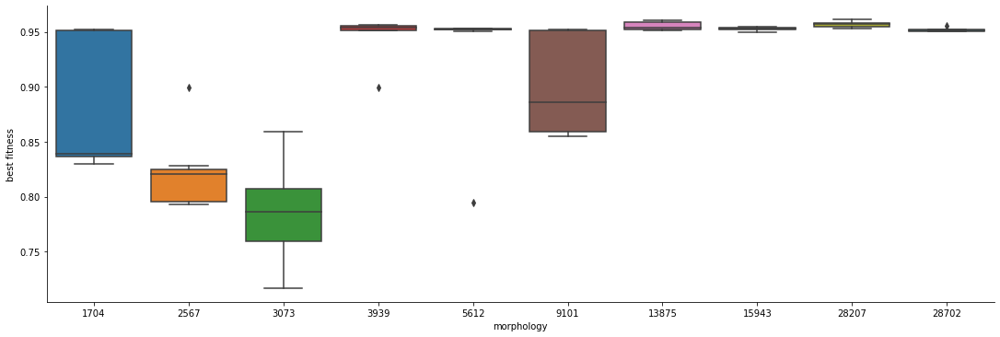

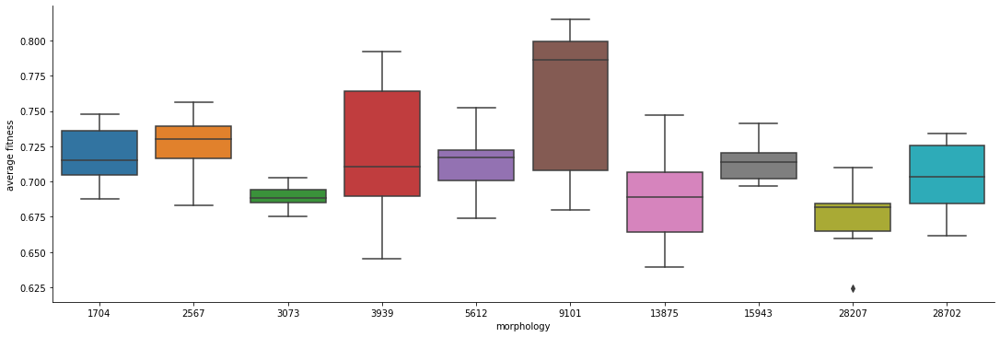

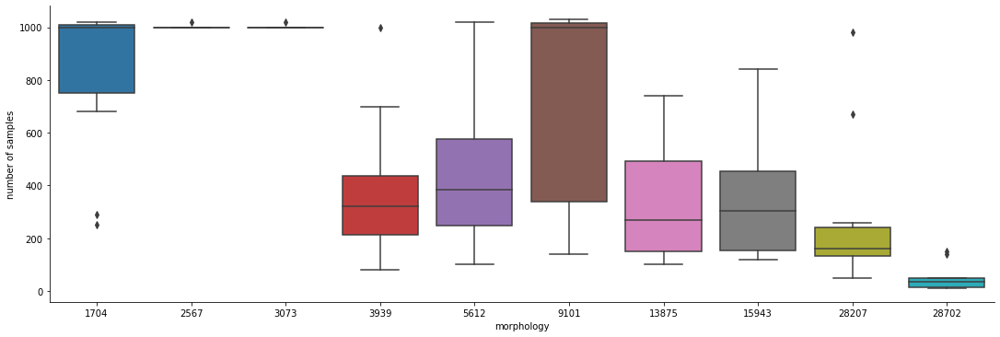

In [41]:
pmni_folder = "/home/leni/are-logs/pmnipes_escape_functPop_eval/"
Maze = "Escape Room"
best_fit_dict = dict()
avg_fit_dict = dict()
nbr_eval_dict = dict()
lines = []
for folder in os.listdir(pmni_folder) :
    for morph_dir in os.listdir(pmni_folder + folder) :
        if(morph_dir.split('_')[0] != "morph"):
            continue
        neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(pmni_folder + folder + '/'+ morph_dir + "/fitnesses.csv",0)        
        key = int(morph_dir.split('_')[1])
        if(best_fit_dict.__contains__(key)) :

            best_fit_dict[key].append(best_fit[-1])
            avg_fit_dict[key].append(max(avg_fit))
            nbr_eval_dict[key].append(neval[-1])
        else :
            best_fit_dict.update({key:[best_fit[-1]]})
            avg_fit_dict.update({key:[max(avg_fit)]})
            nbr_eval_dict.update({key:[neval[-1]]})

descriptors = load_descriptor("/home/leni/git/genomes/20200929/traitDescriptor/lc_nsms_6_7_14-45-54-4875-4076501458/MD_Cart_WDH.csv",8)
ref_desc = np.full(8,0.5)
distances = []
sim_order = [0]
keys = list(avg_fit_dict.keys())
print(keys)
indexes = list(range(1,len(keys)))
k = 0
next_k = 1


avg_neval = []
for k,avg_fit,best_fit, nbr_eval in zip(avg_fit_dict.keys(),avg_fit_dict.values(),best_fit_dict.values(),nbr_eval_dict.values()) :
    avg_neval.append(np.mean(nbr_eval))
    for i in range(len(avg_fit)) :
        lines.append([k,avg_fit[i],best_fit[i],nbr_eval[i]])

        
count_1000 = 0
count_500 = 0
count_200 = 0
count_100 = 0
for v in avg_neval :
    if(v < 1000) :
        count_1000+=1
    if(v < 500):
        count_500+=1
    if(v < 200):
        count_200+=1
    if(v < 100):
        count_100+=1

print(count_1000/len(best_fit_dict)*100,"% of success with less than 1000 samples")
print(count_500/len(best_fit_dict)*100,"% of success with less than 500 samples")
print(count_200/len(best_fit_dict)*100,"% of success with less than 200 samples")
print(count_100/len(best_fit_dict)*100,"% of success with less than 100 samples")
print("Number of morphologies :",len(best_fit_dict))
    
d = pd.DataFrame(data=lines,columns=["morphology","average fitness","best fitness","number of samples"])

ax1 = sns.catplot(x="morphology",y="best fitness",data=d,kind="box",aspect=3,height=5)
ax2 = sns.catplot(x="morphology",y="average fitness",data=d,kind="box",aspect=3,height=5)
ax3 = sns.catplot(x="morphology",y="number of samples",data=d,kind="box",aspect=3,height=5)


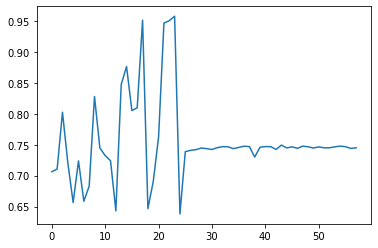

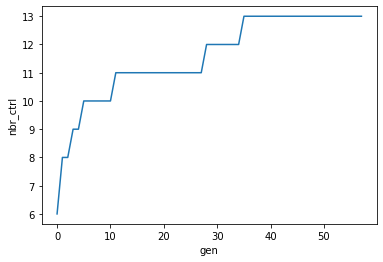

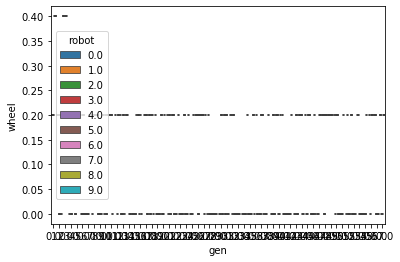

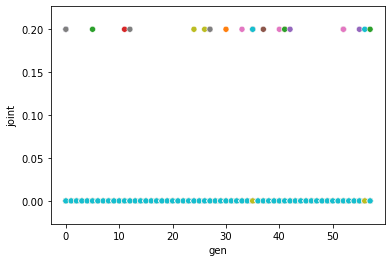

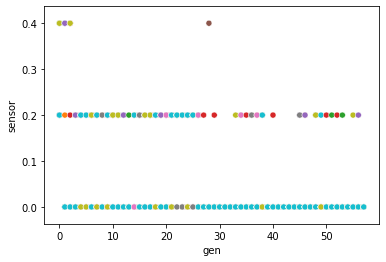

...

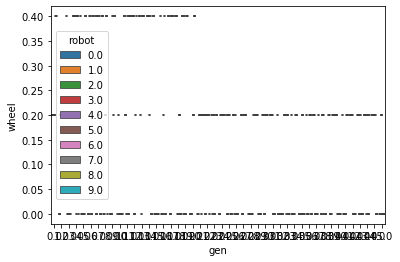

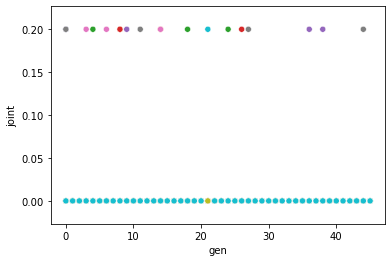

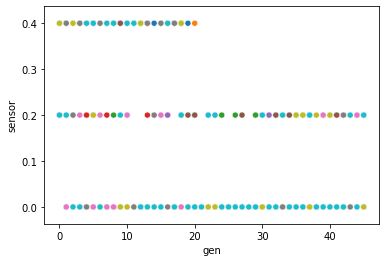

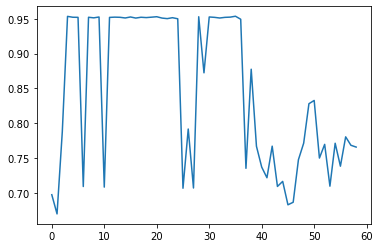

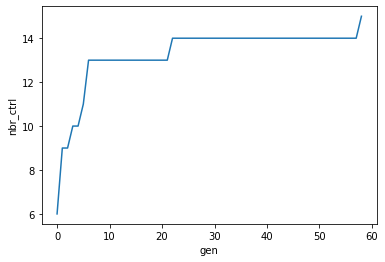

In [ ]:
for i in range(5):
    plt.plot(best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='wheel',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='joint',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='sensor',hue='robot',legend=False)
    plt.show()

In [66]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/escape/"
best_fits = []
avg_fits = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)


In [73]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/escape/"
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [74]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

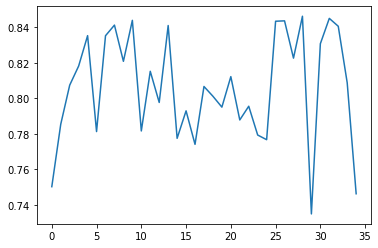

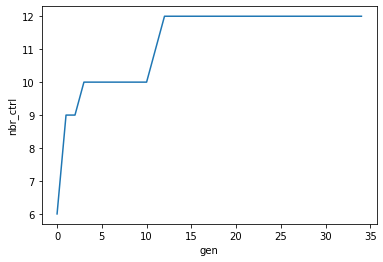

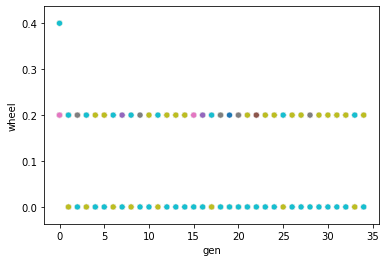

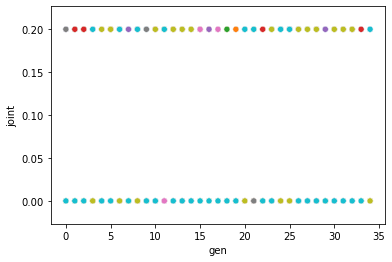

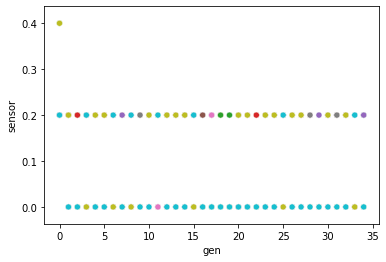

...

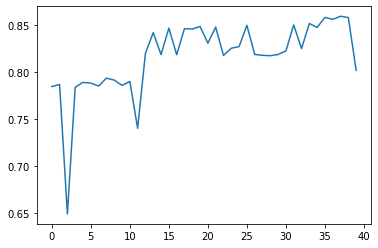

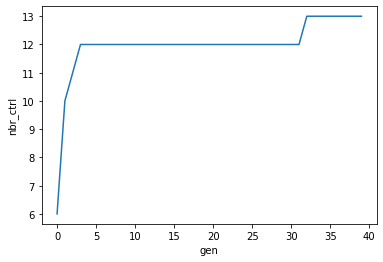

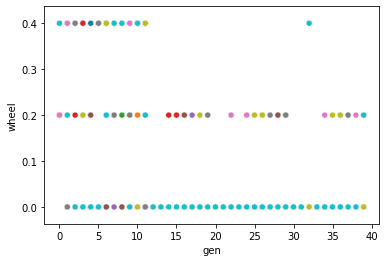

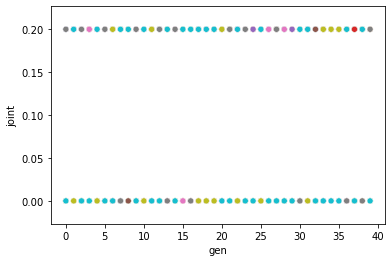

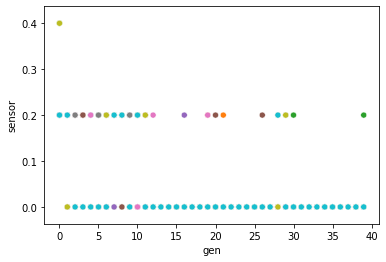

In [75]:
for i in range(5):
    plt.plot(best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='wheel',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='joint',hue='robot',legend=False)
    plt.show()
    sns.scatterplot(data=morph_data[i],x='gen',y='sensor',hue='robot',legend=False)
    plt.show()

BEST FIT


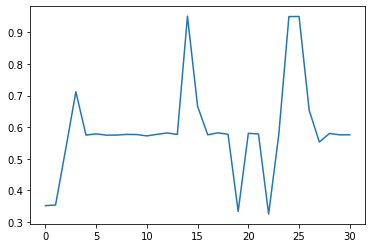

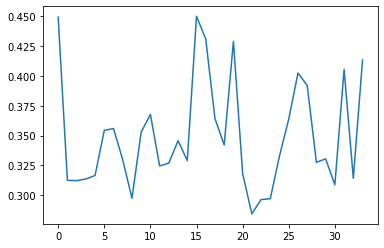

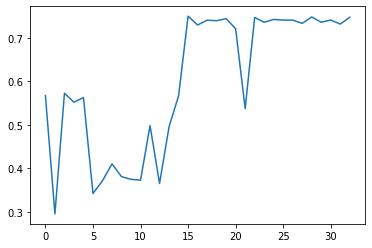

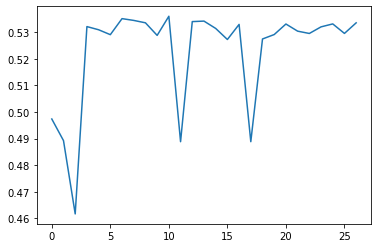

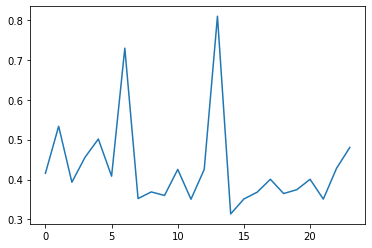

AVG FIT


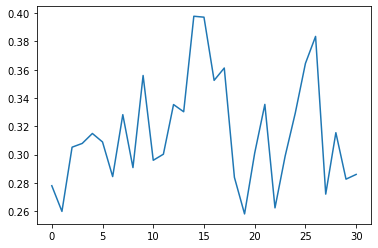

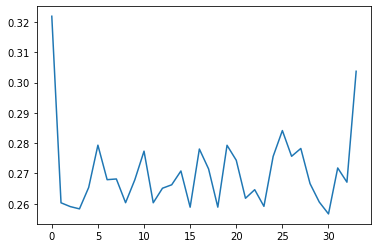

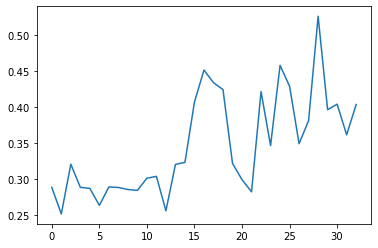

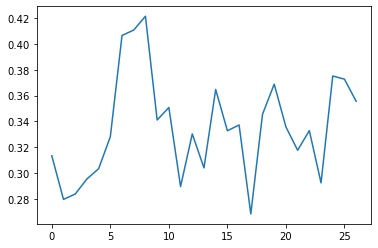

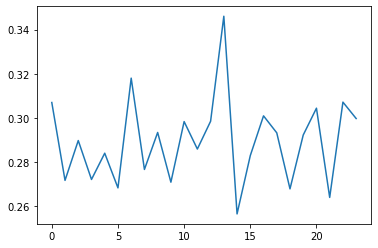

In [76]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/easy/"
best_fits = []
avg_fits = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
print("BEST FIT")
for fit in best_fits:
    plt.plot(fit)
    plt.show()

print("AVG FIT")
for fit in avg_fits:
    plt.plot(fit)
    plt.show()


BEST FIT


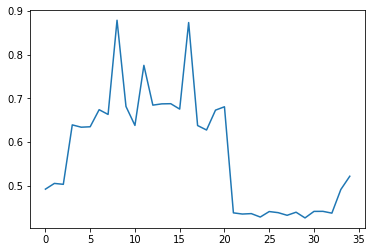

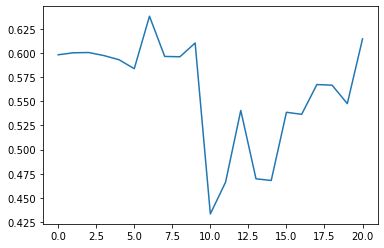

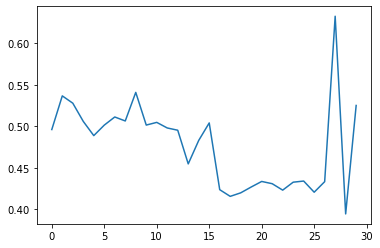

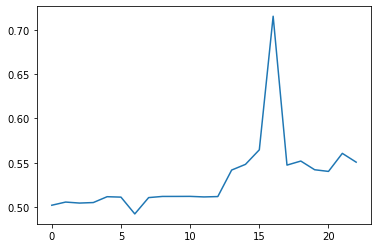

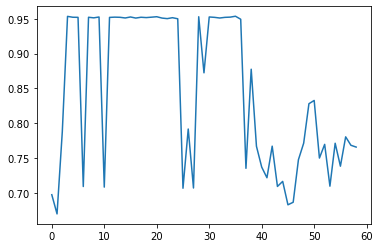

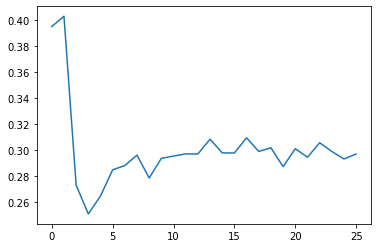

AVG FIT


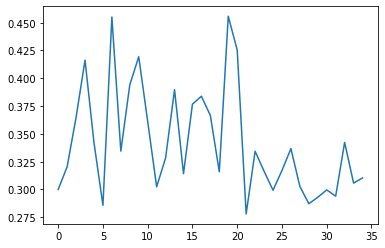

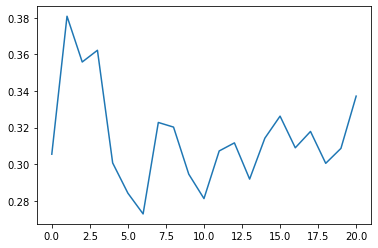

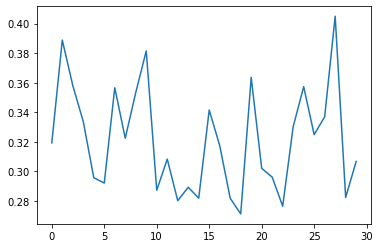

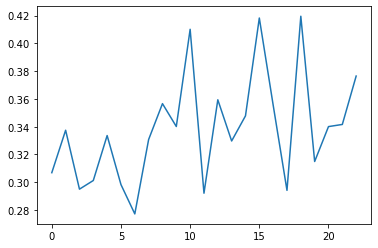

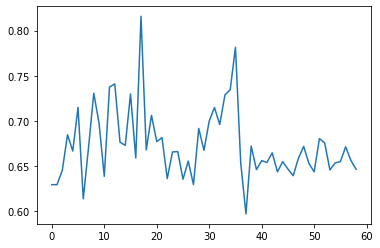

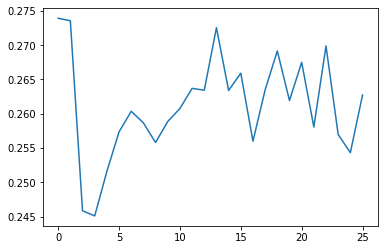

In [9]:
exp_folder = "/home/leni/are-logs/mnipes_first_exp/hard/"
best_fits = []
avg_fits = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)

print("BEST FIT")
for fit in best_fits:
    plt.plot(fit)
    plt.show()

print("AVG FIT")
for fit in avg_fits:
    plt.plot(fit)
    plt.show()


In [133]:
def plot_hist_nbr_rob(title,data,organ,bins,nb_rob):
    fig = plt.gcf()
    fig.set_size_inches(25,10)
    ax = sns.histplot(data=data,multiple="stack",bins=bins,x='gen',hue=organ,palette="light:b")
    ax.set_ylabel("Number of robots",fontsize=20)
    ax.set_xlabel("Generations",fontsize=20)
    plt.title(title,fontsize=20)
    plt.xticks(fontsize=20)
    plt.yticks(range(1,nb_rob+1),labels=[1]*nb_rob,fontsize=20)
    plt.show()

In [150]:
nocap_v_wcap = []
speedup_nvw = []

In [209]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    print(folder)
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

mnipes_18_10_11-15-21-1798-2901853271
mnipes_18_10_11-15-17-7440-3455352808
mnipes_18_10_11-15-23-3637-3772116629
mnipes_18_10_11-15-27-7559-1773119749
mnipes_18_10_11-15-27-7576-4271991905


In [210]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [211]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*5,desc[7]*5,desc[8]*5])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [212]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = copy.copy(neval_per_gen[i])    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

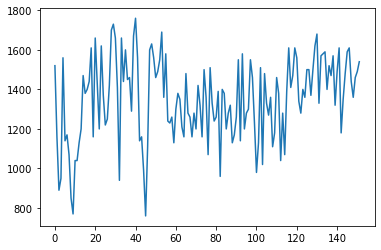

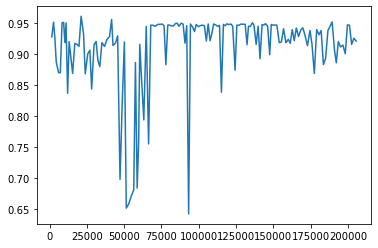

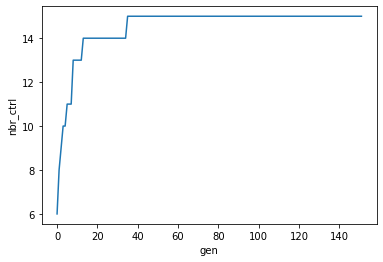

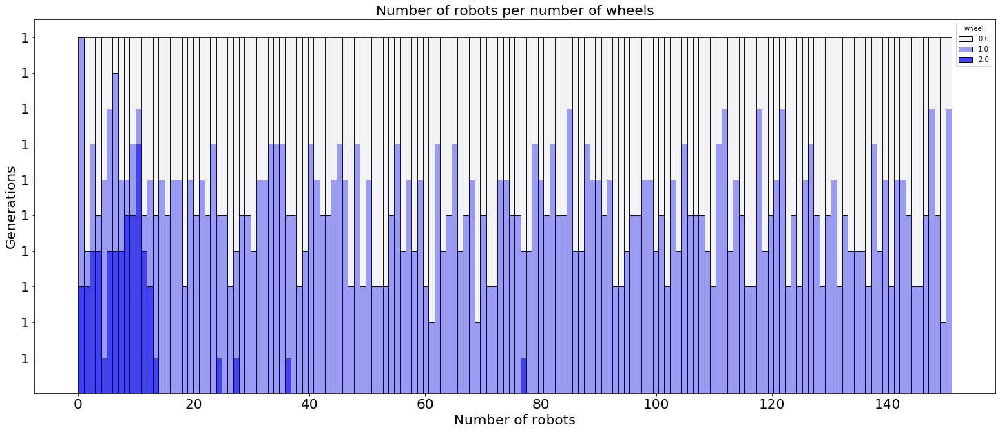

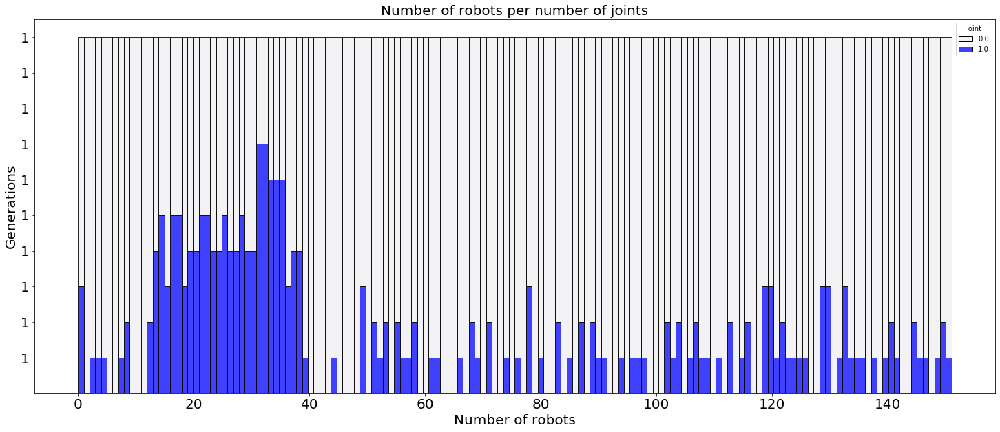

...

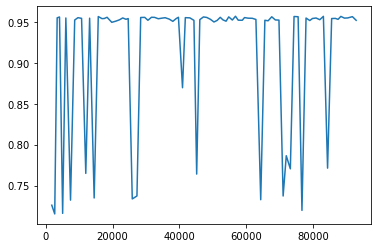

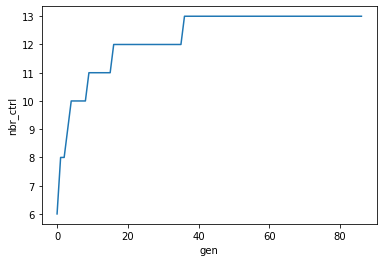

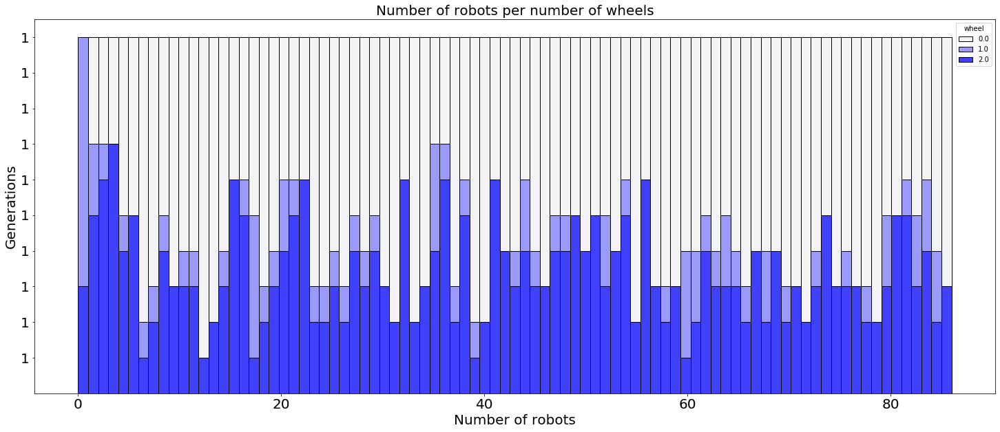

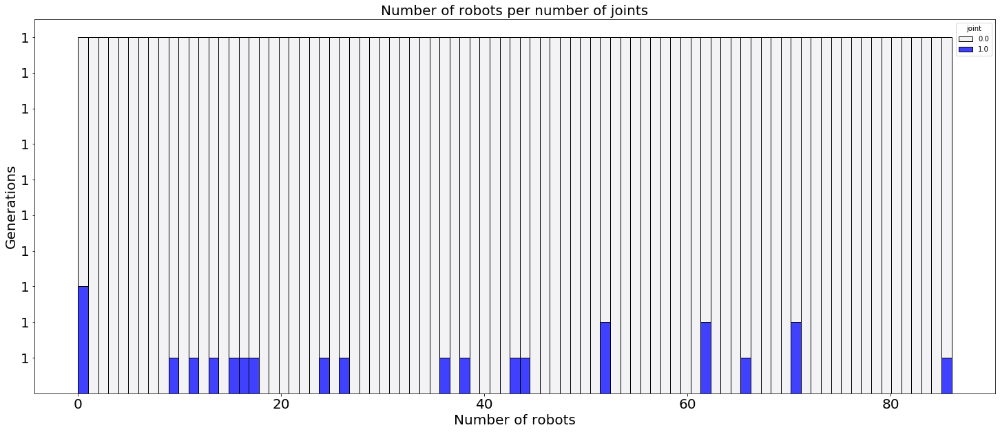

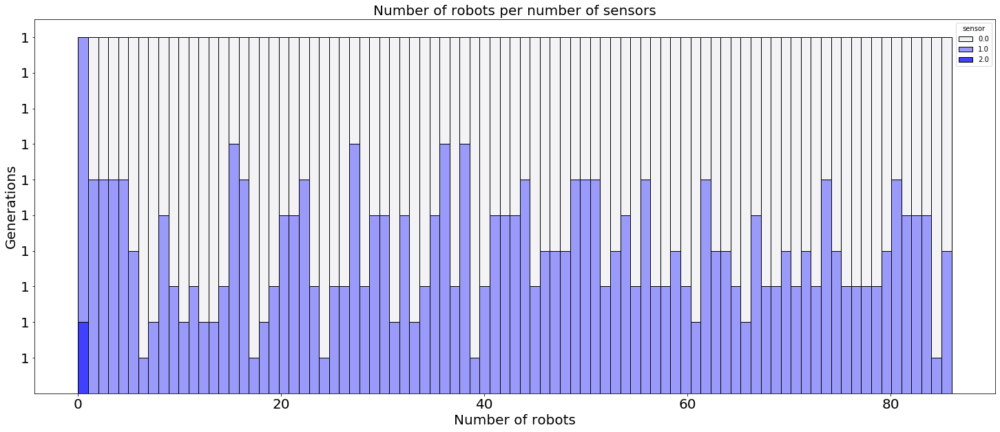

In [214]:
for i in range(5):
    plt.plot(neval_per_gen[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [201]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    print(folder)
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

mnipes_18_10_11-14-26-6731-694868892
mnipes_18_10_11-14-45-5063-1659556997
mnipes_18_10_11-14-28-8516-2056406433
mnipes_18_10_11-14-39-9603-2958452000
mnipes_18_10_11-14-37-7441-2118960898


In [202]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [203]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*5,desc[7]*5,desc[8]*5])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [205]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = copy.copy(neval_per_gen[i])    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

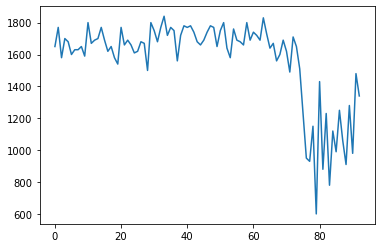

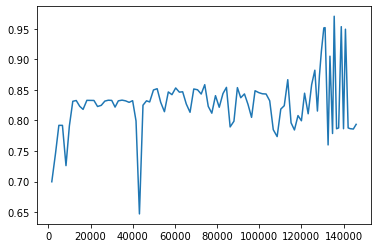

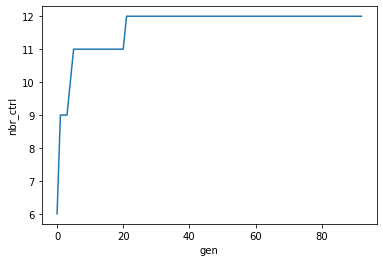

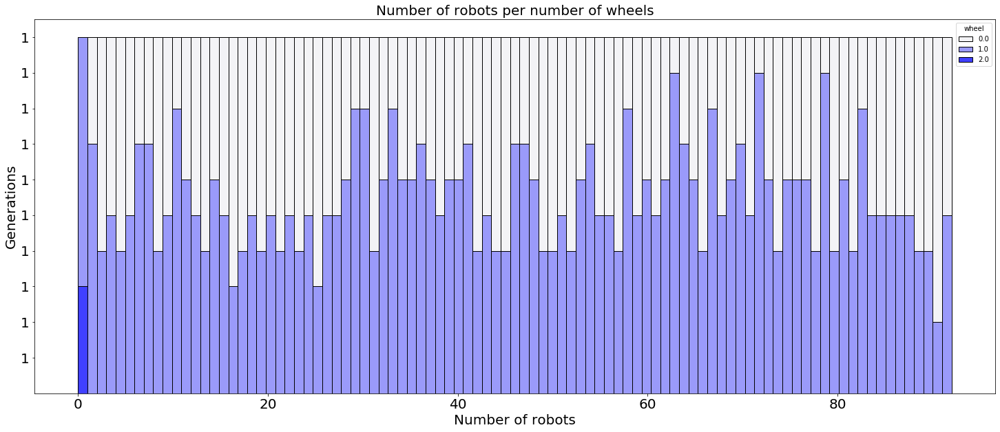

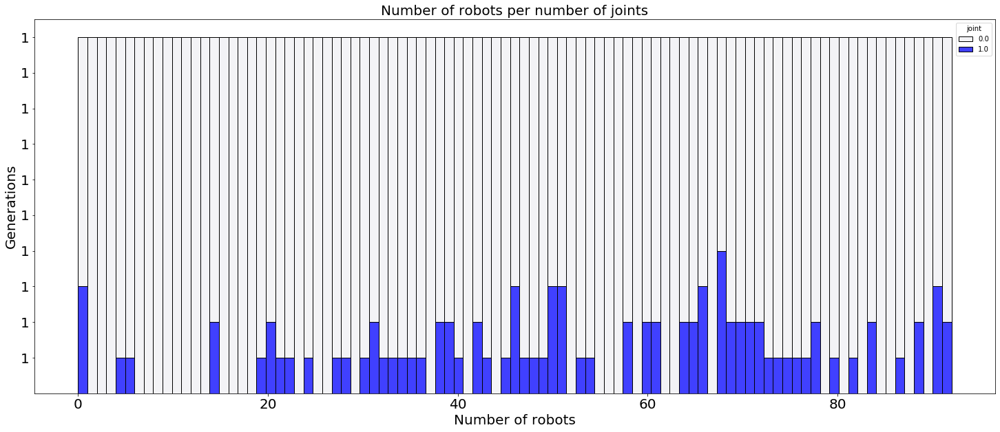

...

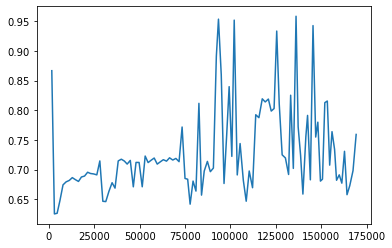

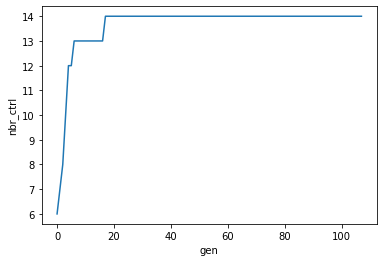

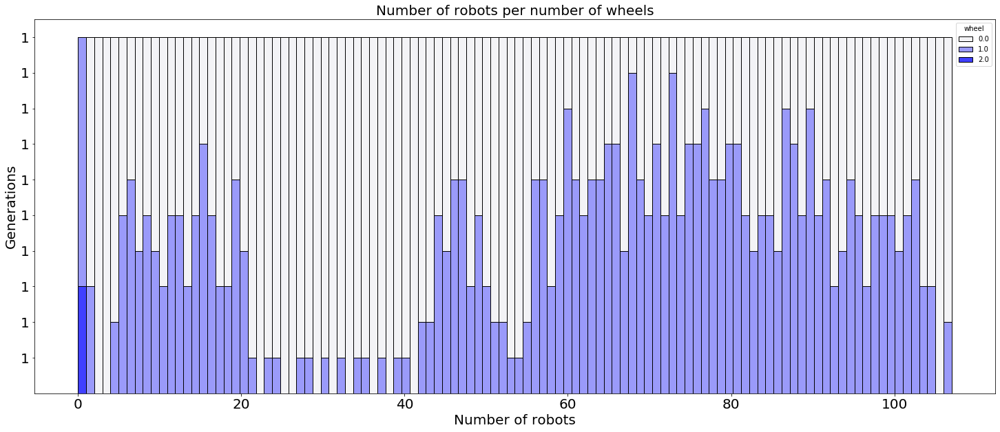

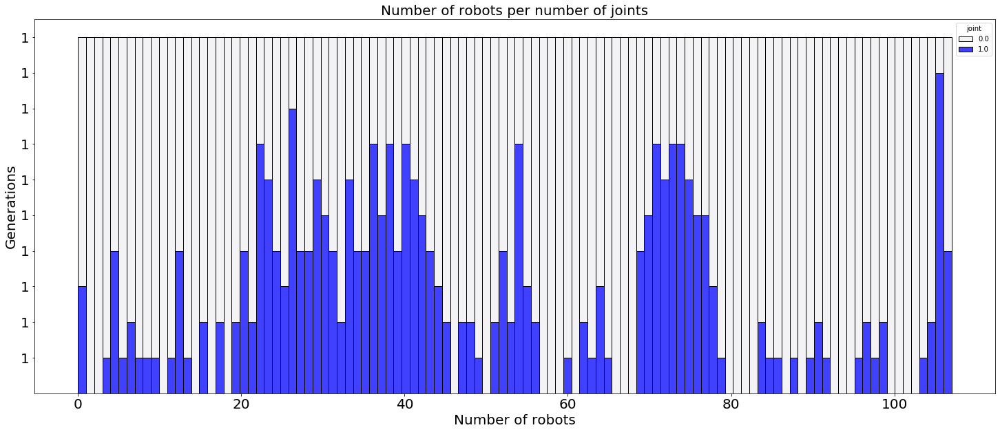

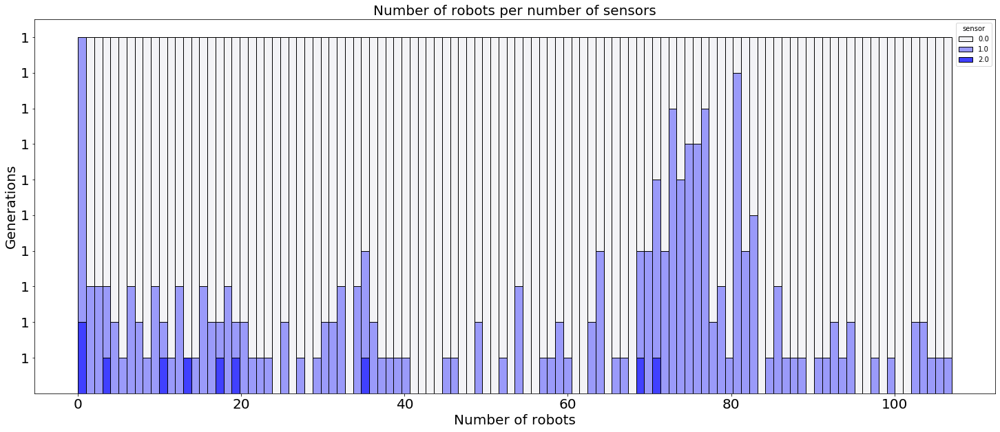

In [206]:
for i in range(5):
    plt.plot(neval_per_gen[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [161]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [162]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [163]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [164]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

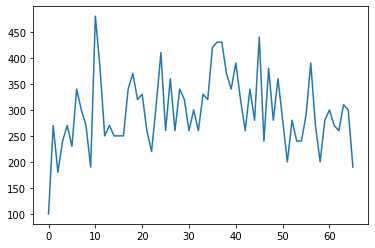

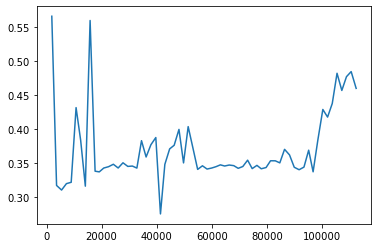

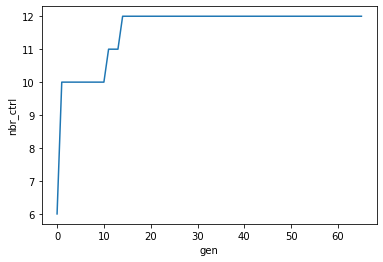

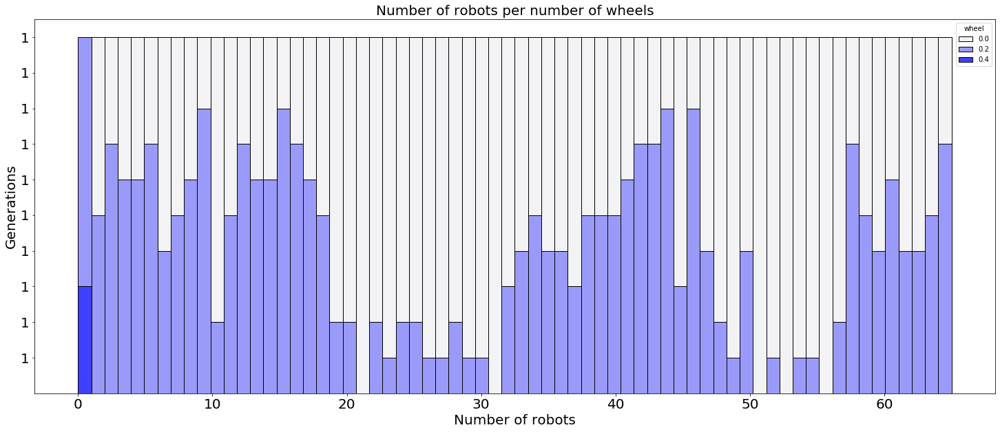

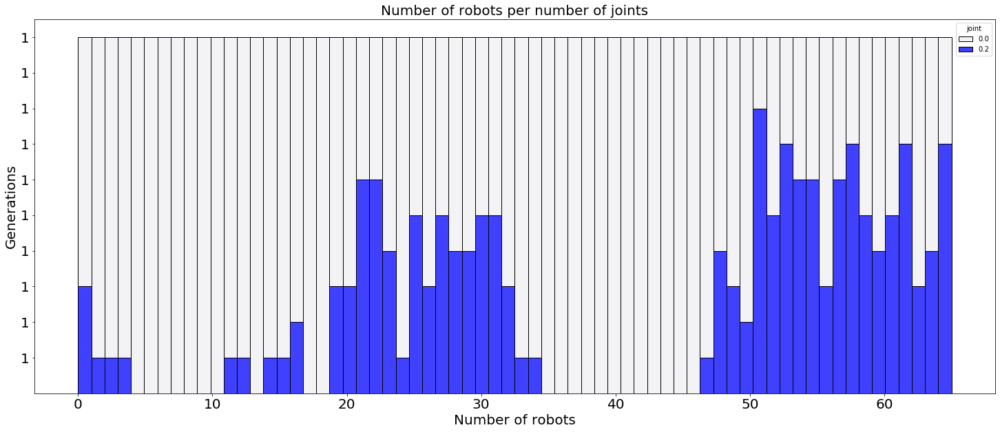

...

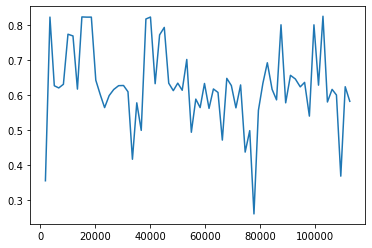

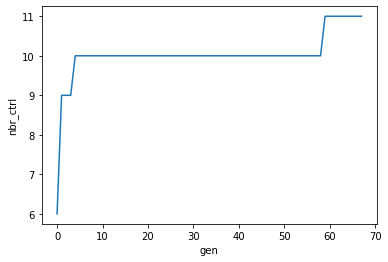

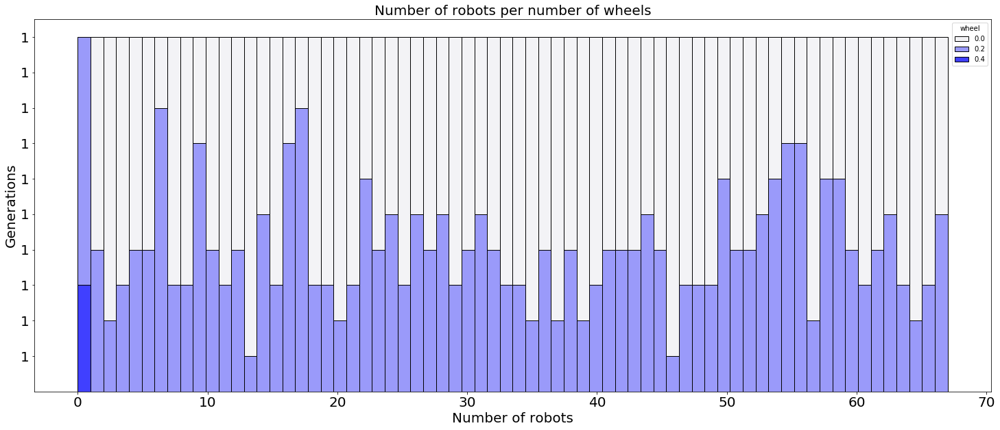

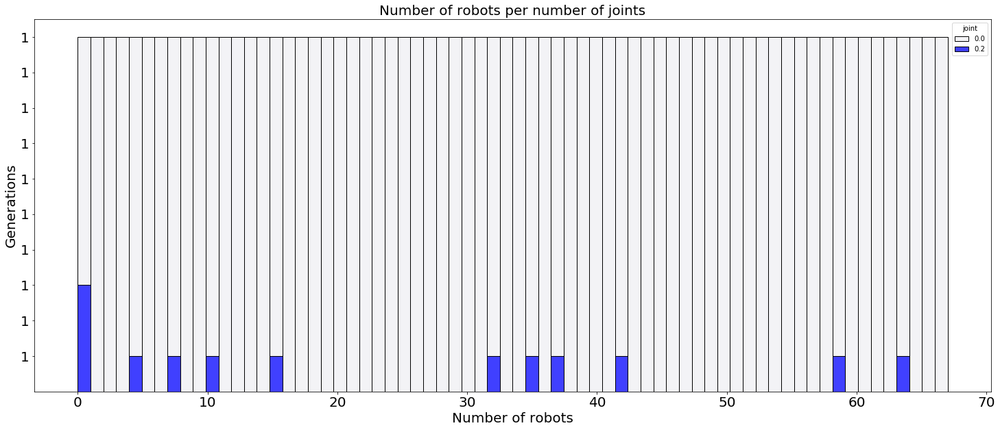

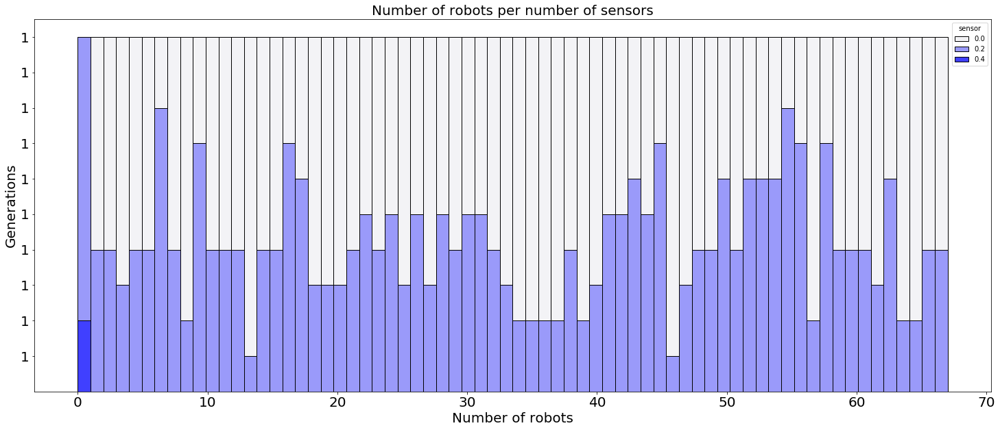

IndexError: list index out of range

In [165]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [166]:
exp_folder = "/home/leni/are-logs/mnipes_second_exp/hard/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","hard",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [167]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [168]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [169]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","hard",max(speedup[-1]),np.mean(speedup[-1])])

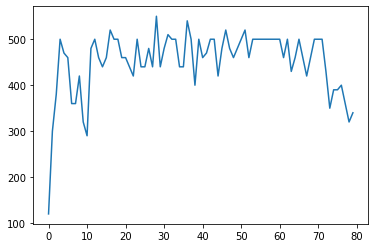

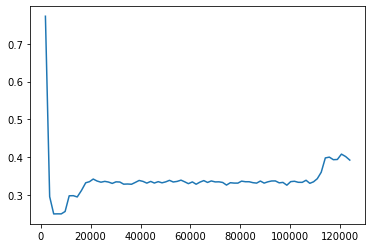

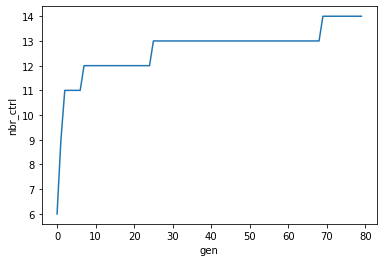

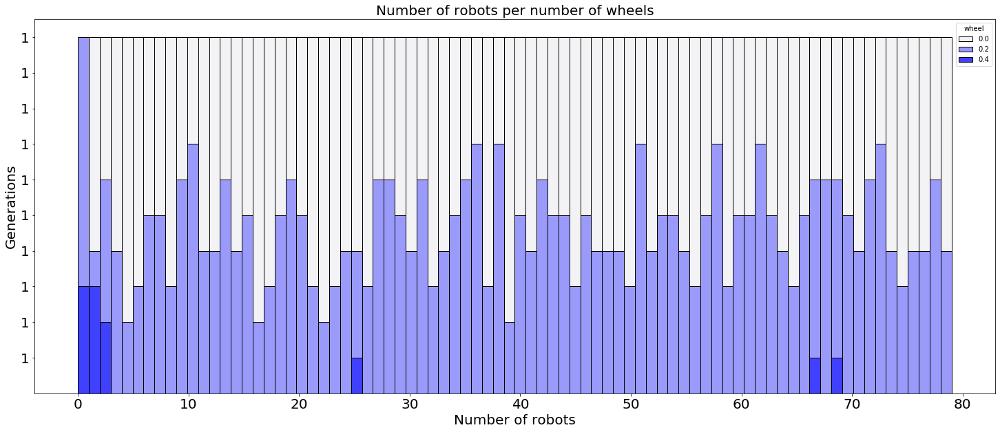

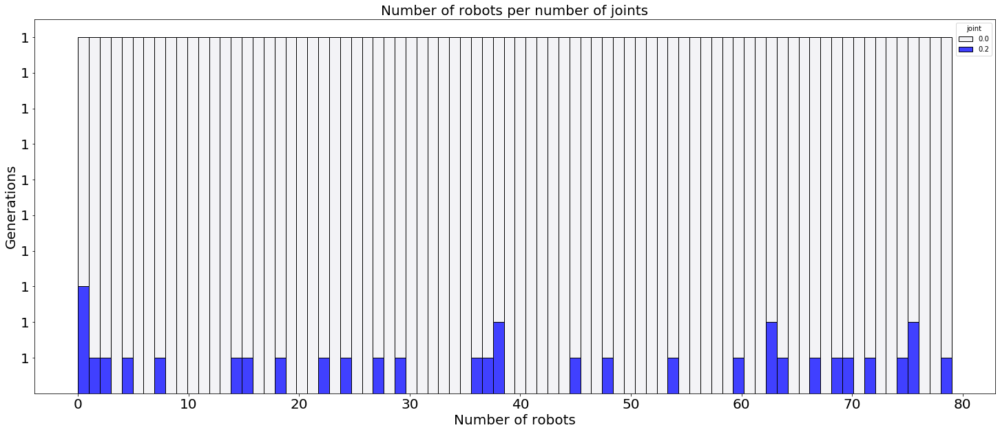

...

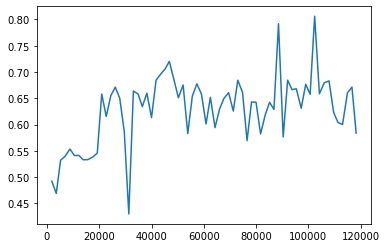

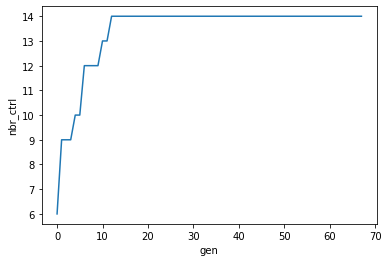

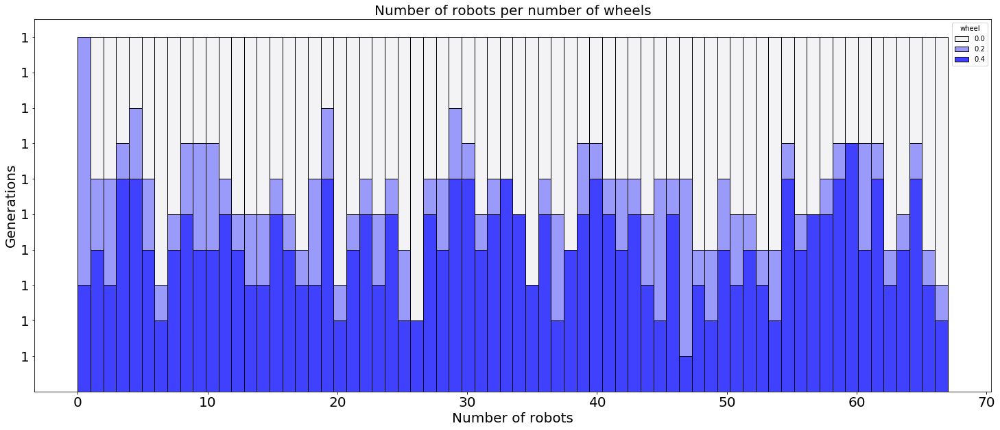

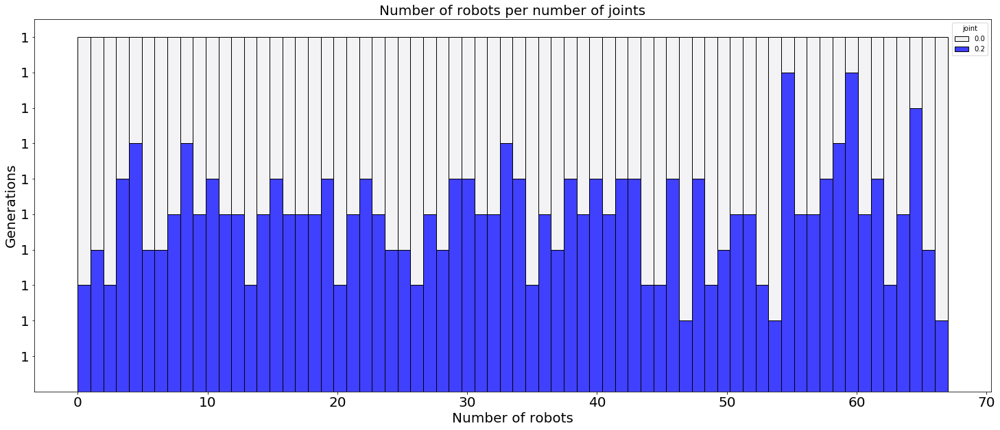

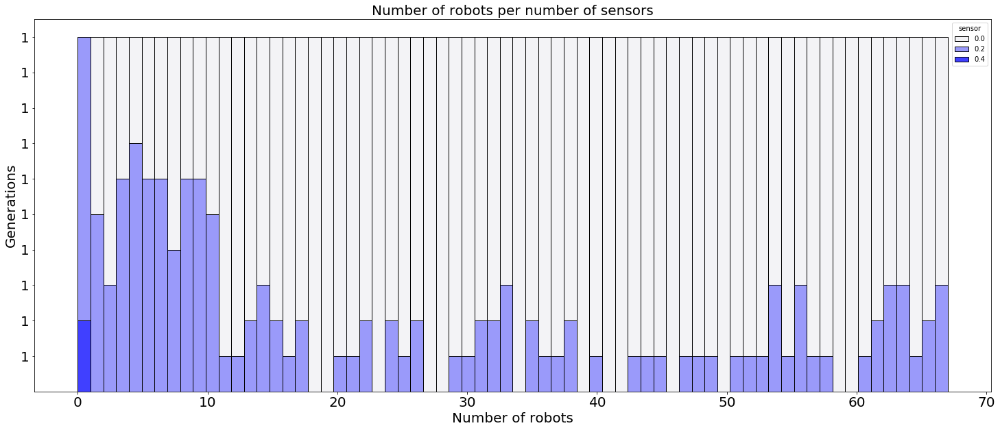

IndexError: list index out of range

In [170]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [171]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [172]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [173]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

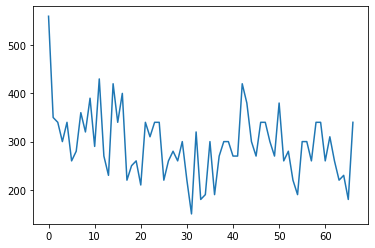

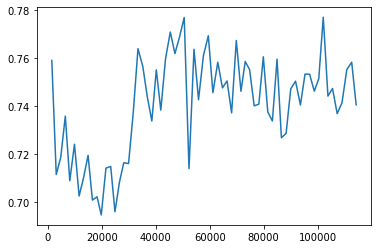

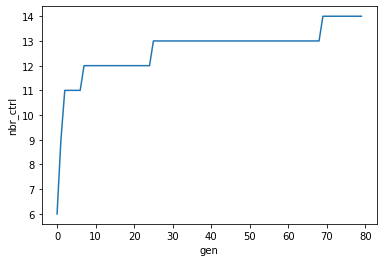

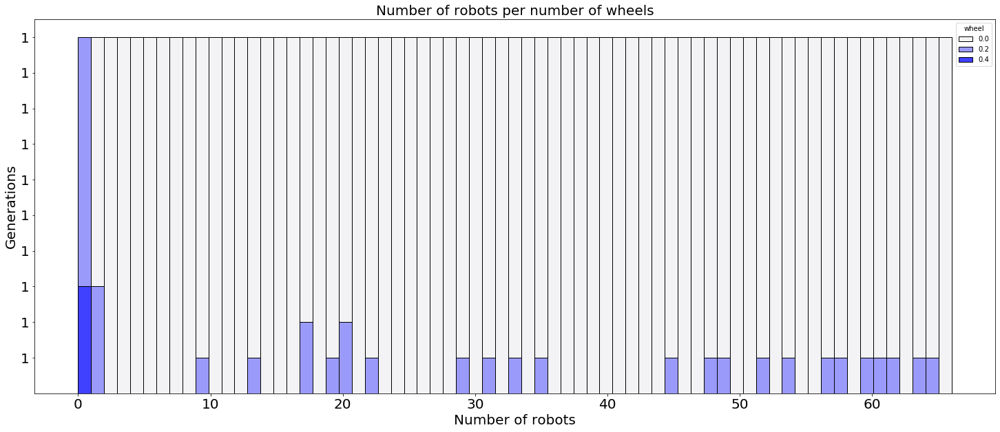

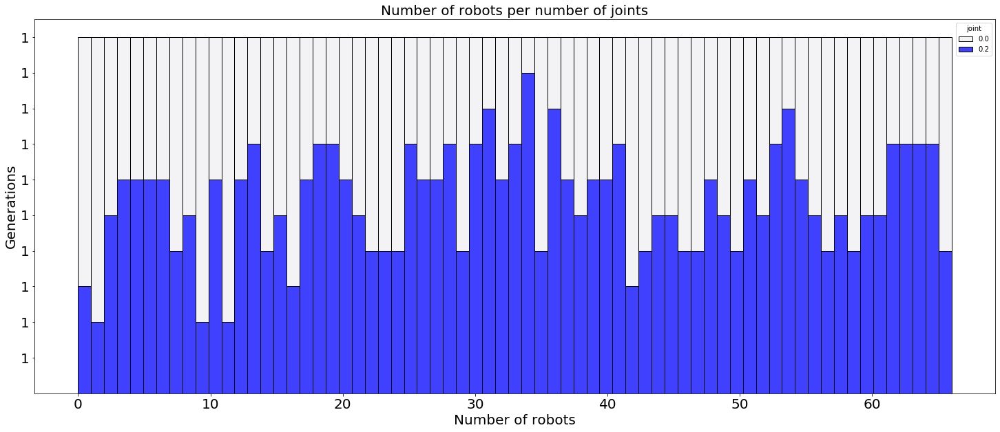

...

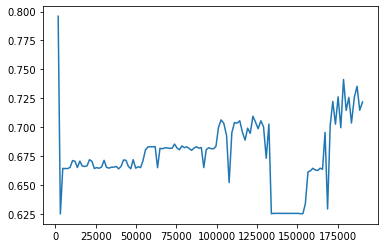

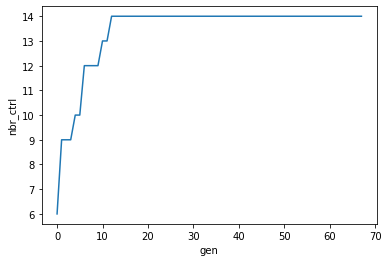

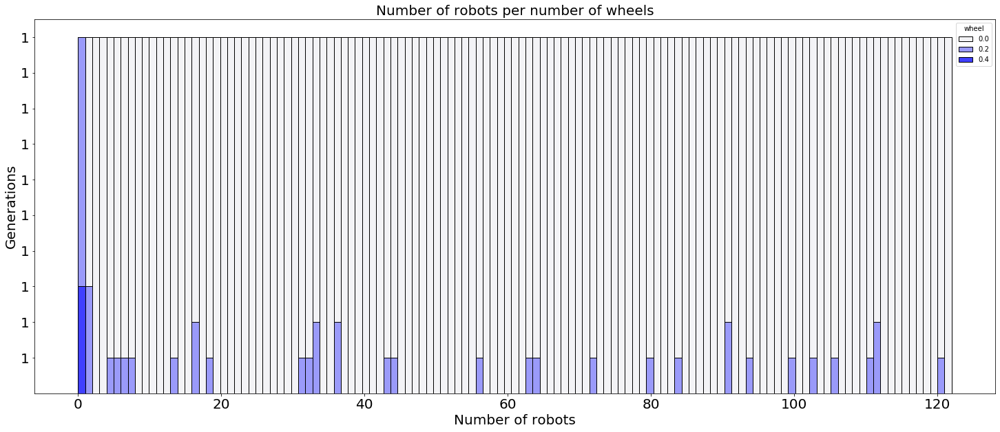

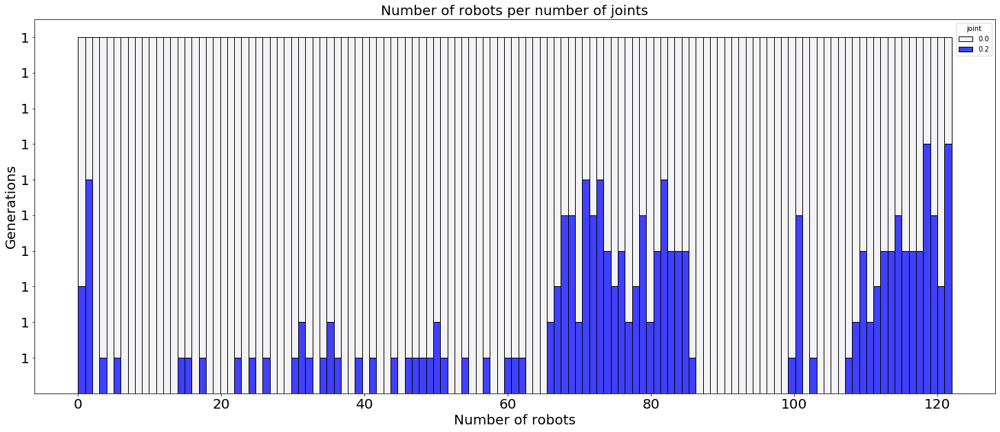

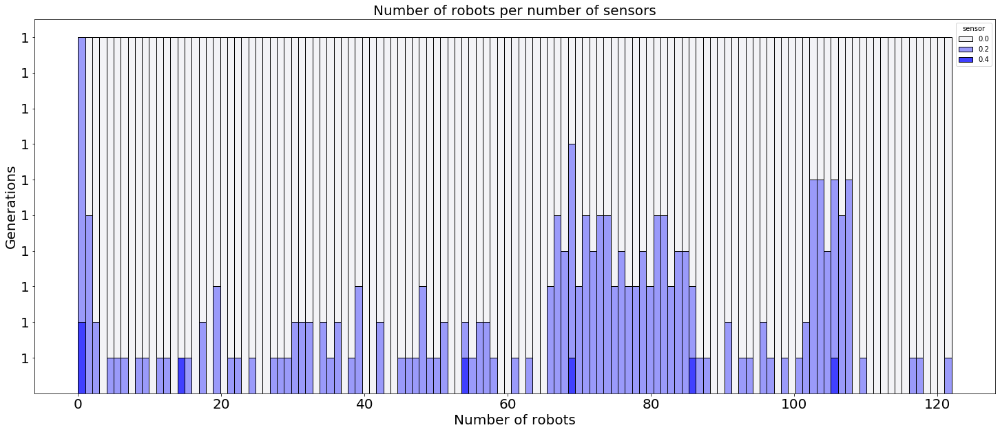

IndexError: list index out of range

In [174]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [176]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [177]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*5,desc[7]*5,desc[8]*5])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [178]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

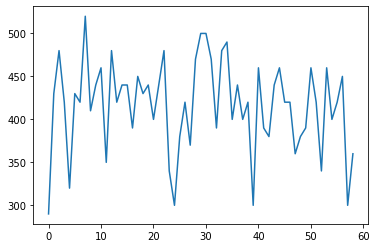

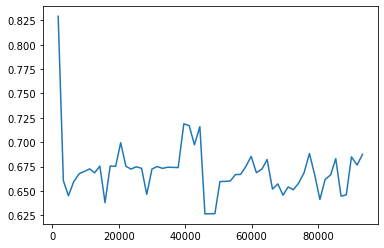

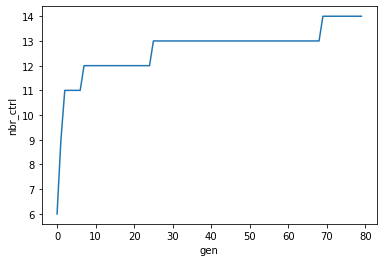

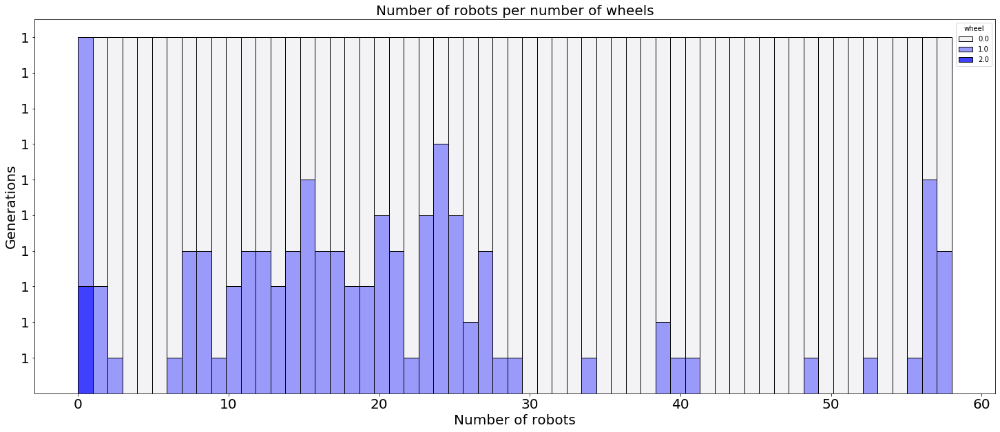

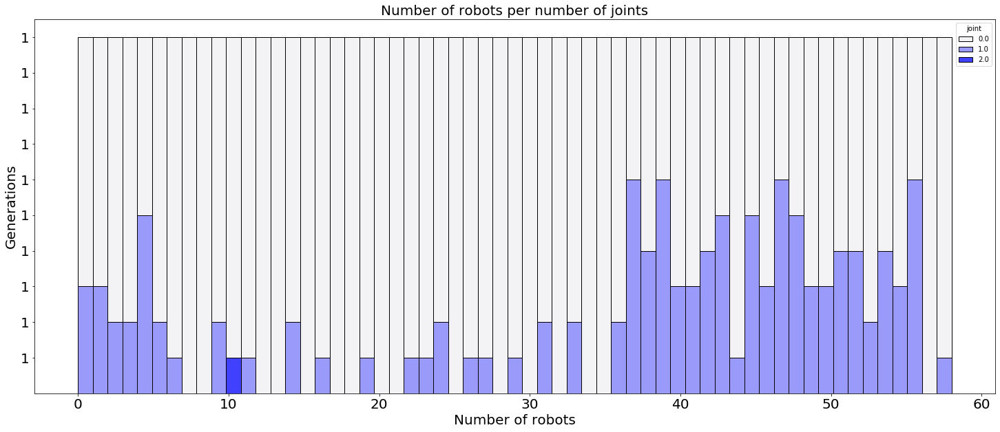

...

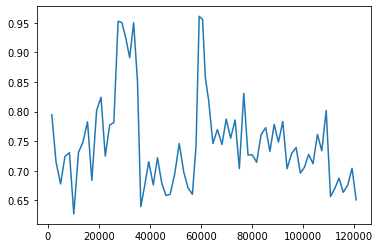

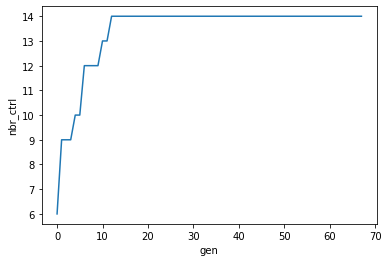

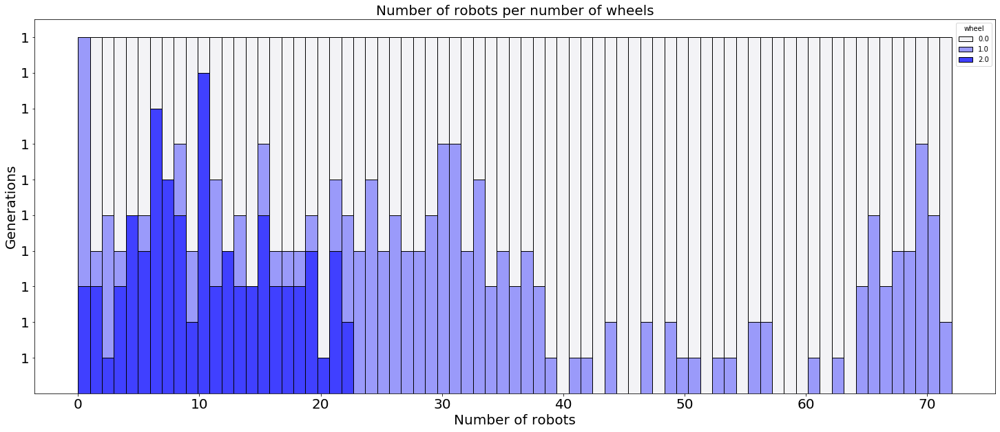

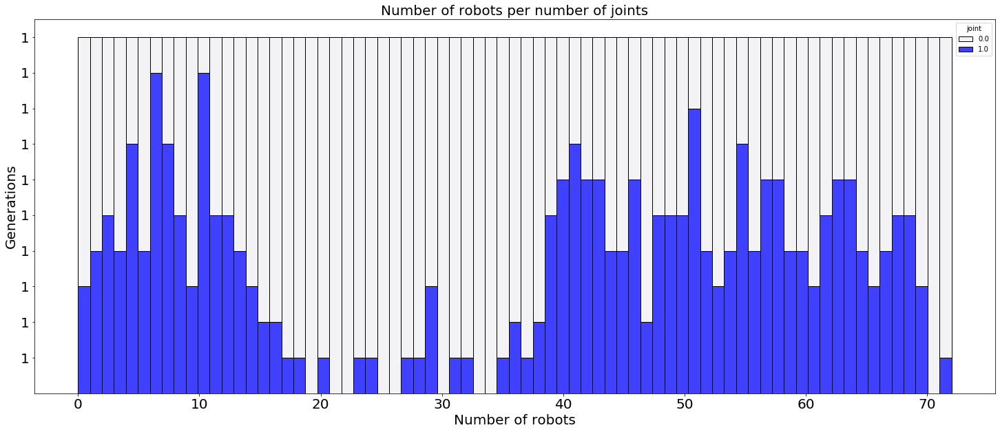

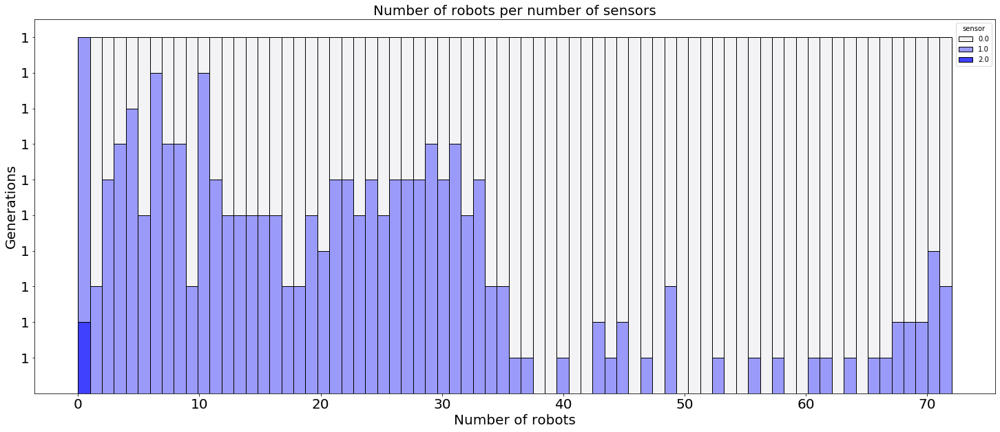

IndexError: list index out of range

In [179]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [181]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [182]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [183]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

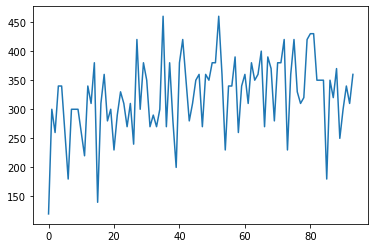

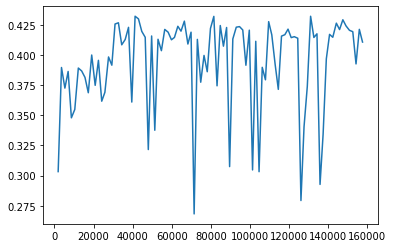

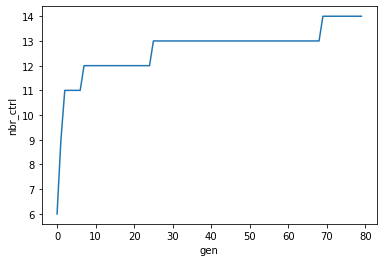

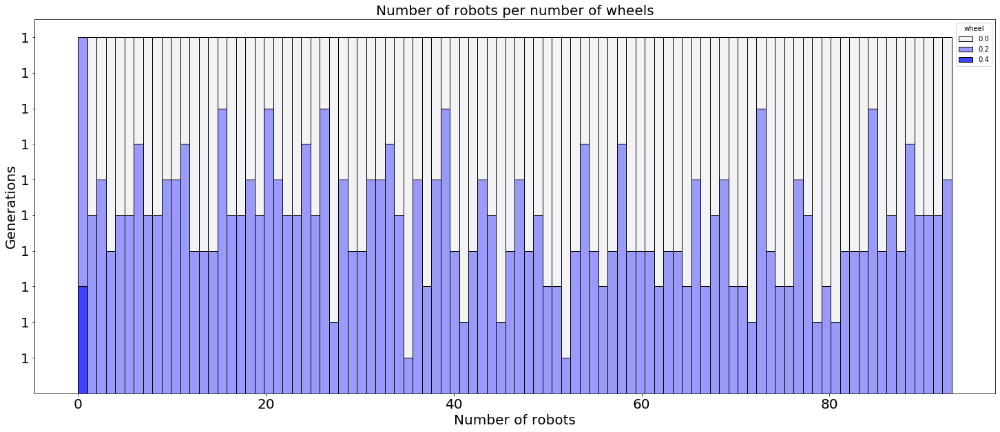

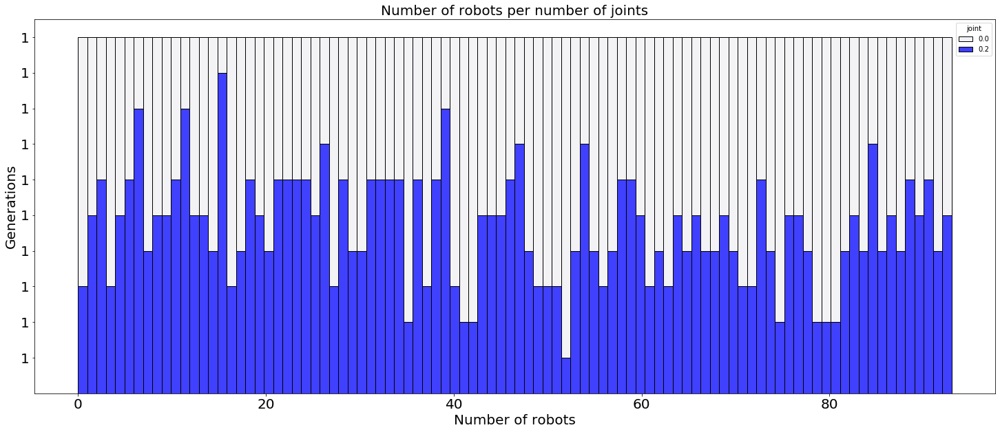

...

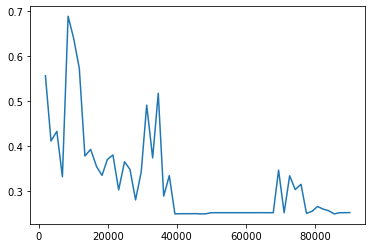

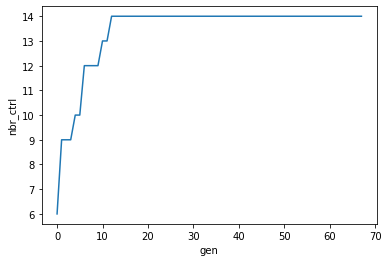

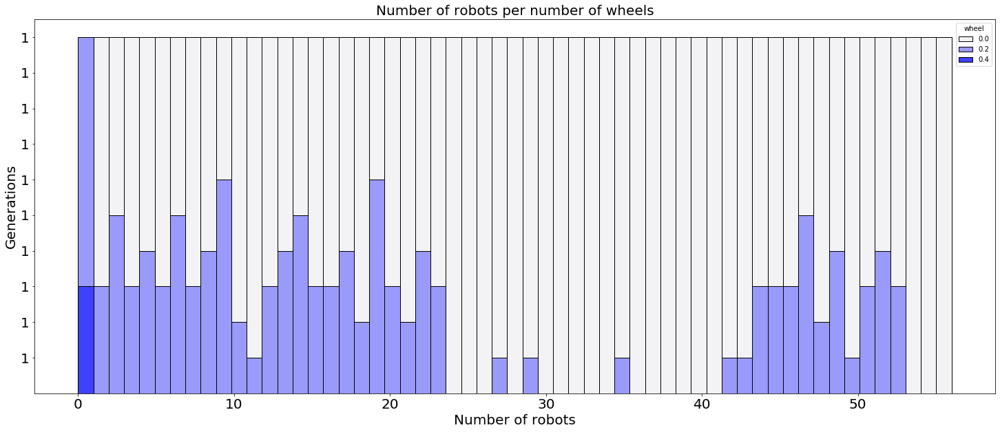

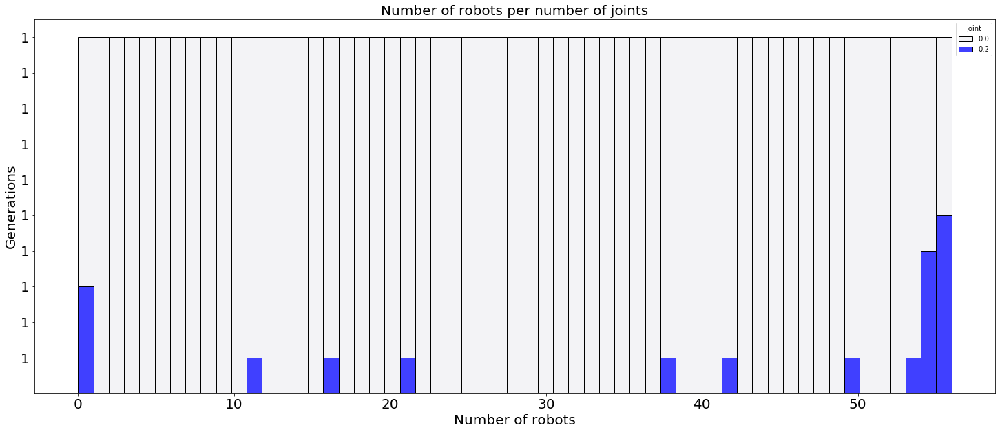

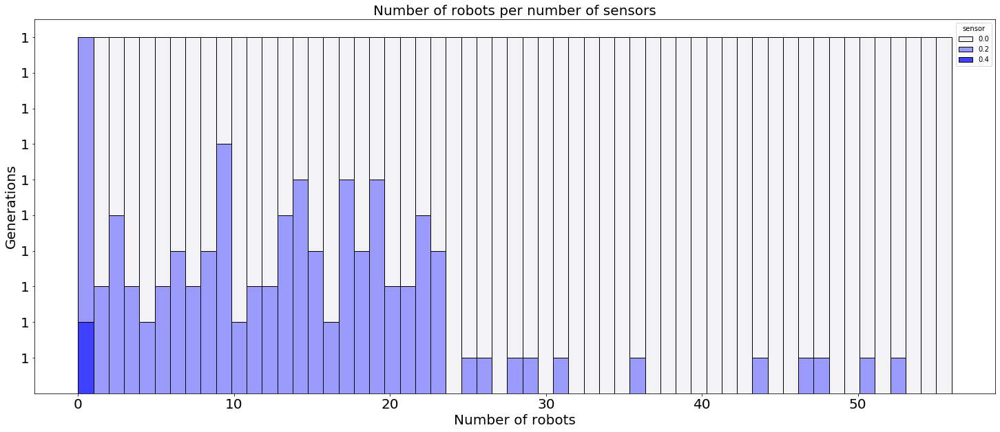

IndexError: list index out of range

In [184]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [186]:
exp_folder = "/home/leni/are-logs/mnipes_third_exp_noca/hard/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","hard",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

In [187]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6],desc[7],desc[8]])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [188]:
speedup = []
neval = []
for i in range(4):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","hard",max(speedup[-1]),np.mean(speedup[-1])])

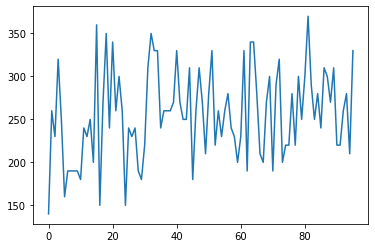

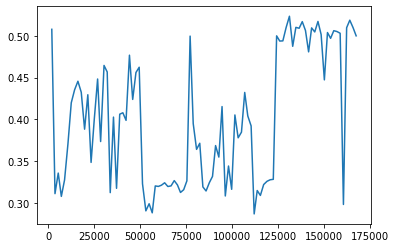

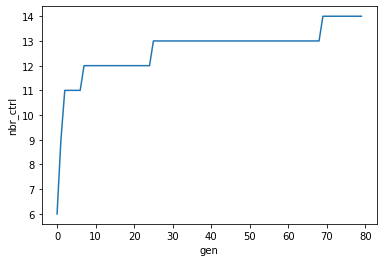

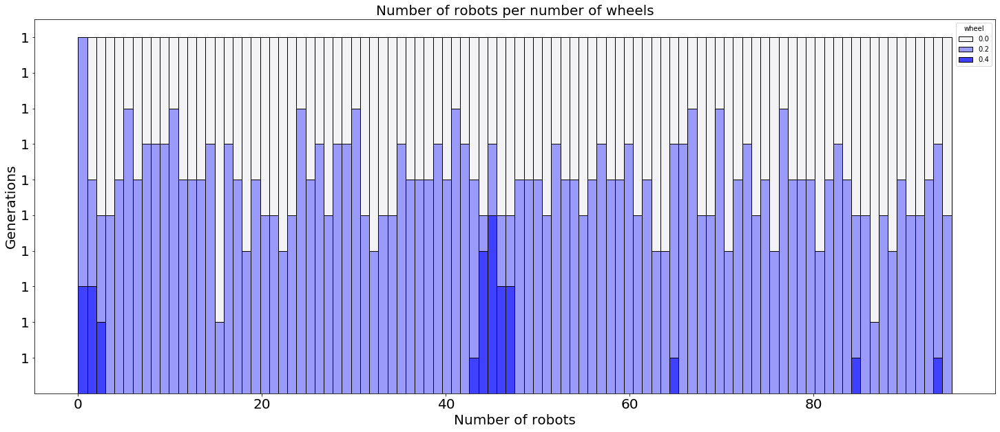

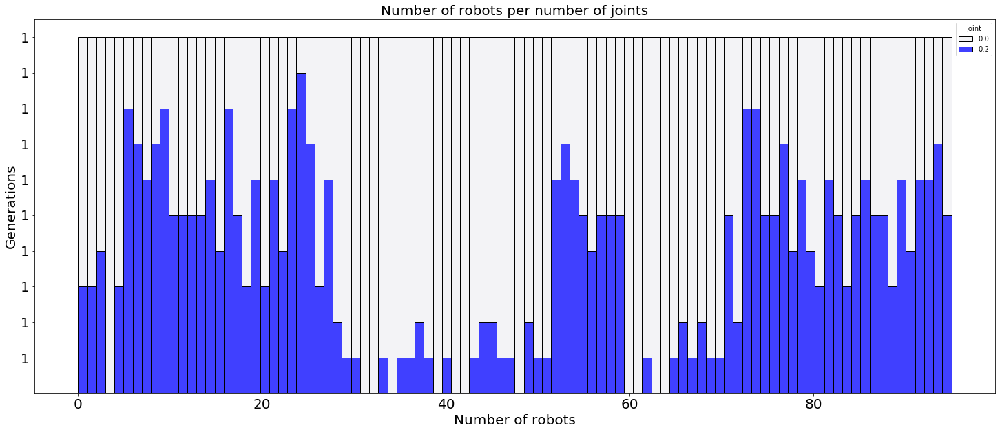

...

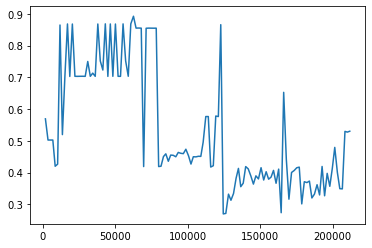

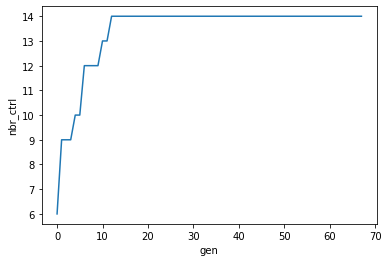

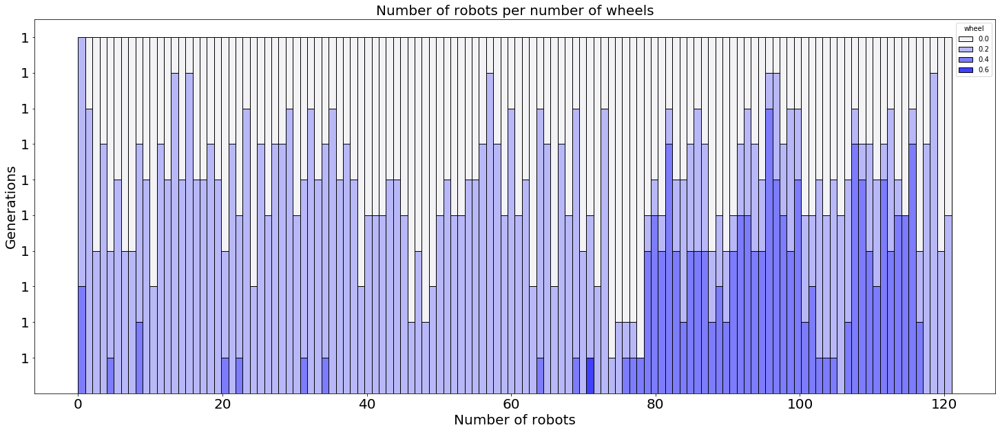

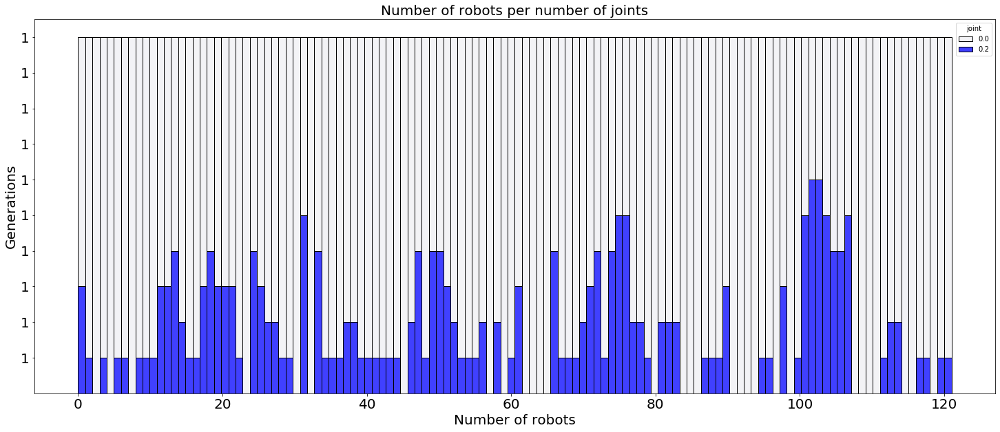

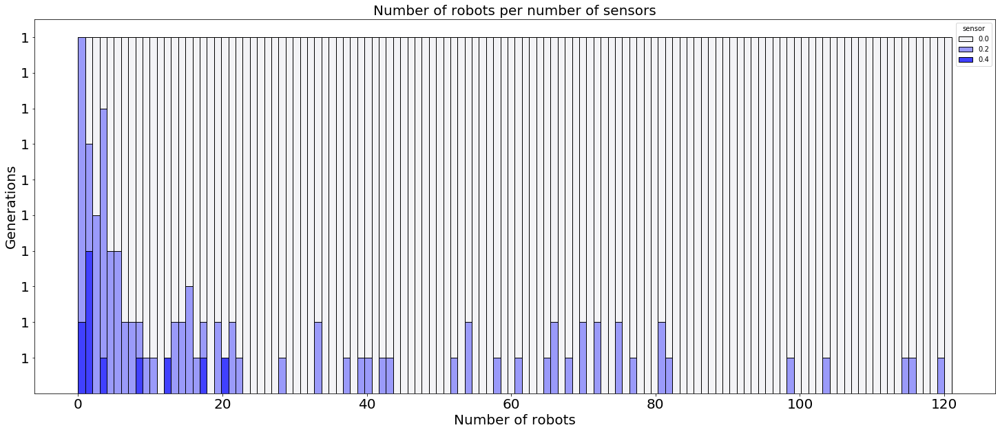

IndexError: list index out of range

In [189]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [193]:
ca_data = pd.DataFrame(data=nocap_v_wcap,columns=["alg","env","max best fit","max avg fit","avg best fit","avg avg fit"])
speed_data = pd.DataFrame(data=speedup_nvw,columns=["alg","env","max speed up","avg speed up"])

<AxesSubplot:xlabel='env', ylabel='max best fit'>

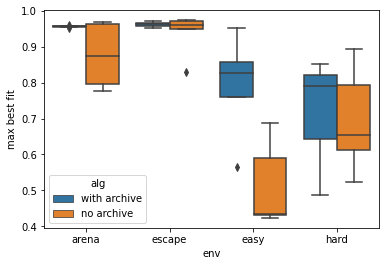

In [22]:
sns.boxplot(data=ca_data,x="env",y="max best fit",hue="alg")

<AxesSubplot:xlabel='env', ylabel='max avg fit'>

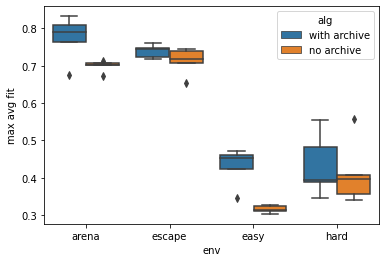

In [23]:
sns.boxplot(data=ca_data,x="env",y="max avg fit",hue="alg")

<AxesSubplot:xlabel='env', ylabel='avg best fit'>

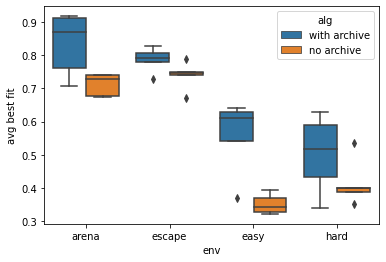

In [24]:
sns.boxplot(data=ca_data,x="env",y="avg best fit",hue="alg")

<AxesSubplot:xlabel='env', ylabel='avg avg fit'>

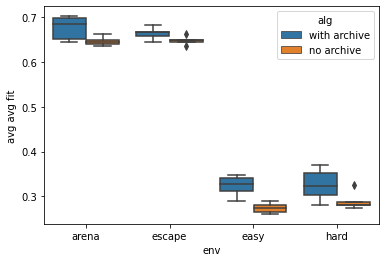

In [25]:
sns.boxplot(data=ca_data,x="env",y="avg avg fit",hue="alg")

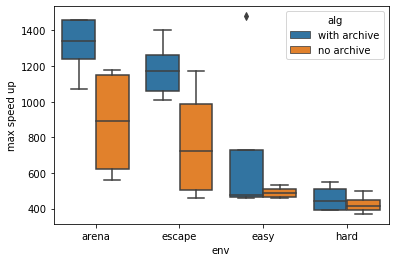

In [191]:
sns.boxplot(data=speed_data,x="env",y="max speed up",hue="alg")

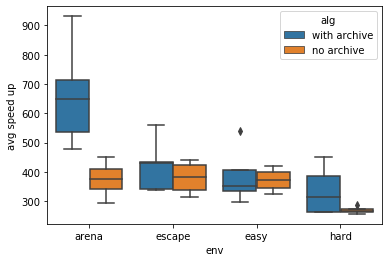

In [194]:
sns.boxplot(data=speed_data,x="env",y="avg speed up",hue="alg")

In [107]:
nocap_v_wcap = []
speedup_nvw = []

In [108]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

68
60
49
74
32


In [74]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [75]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [109]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

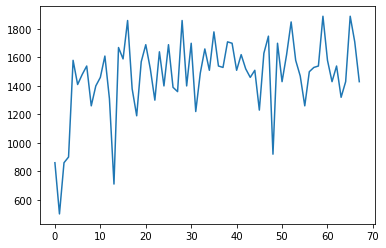

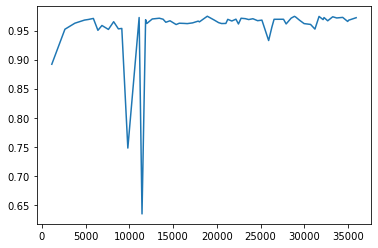

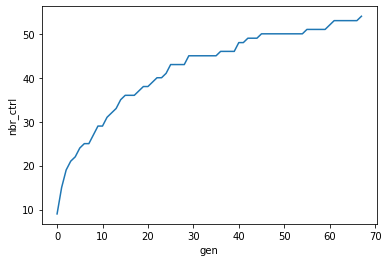

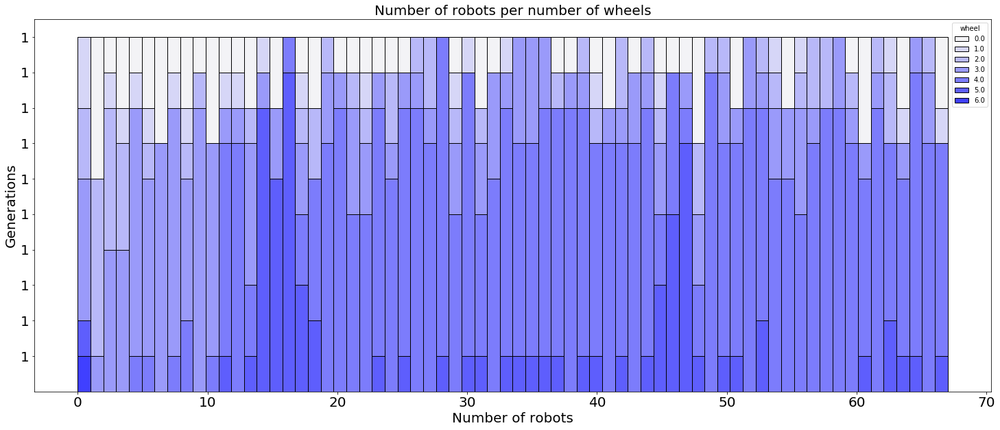

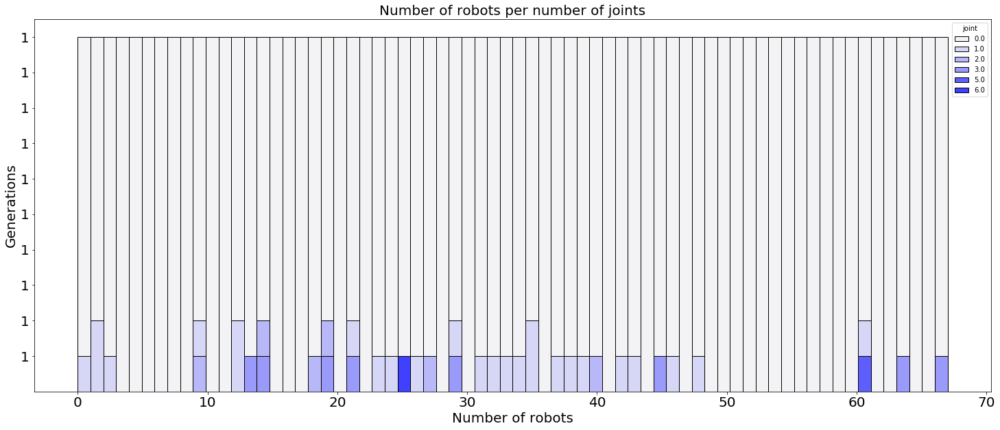

...

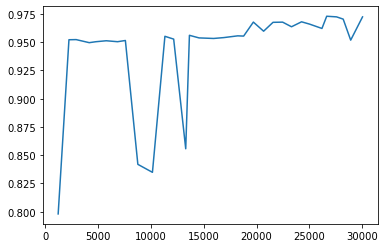

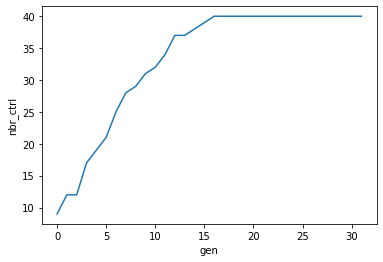

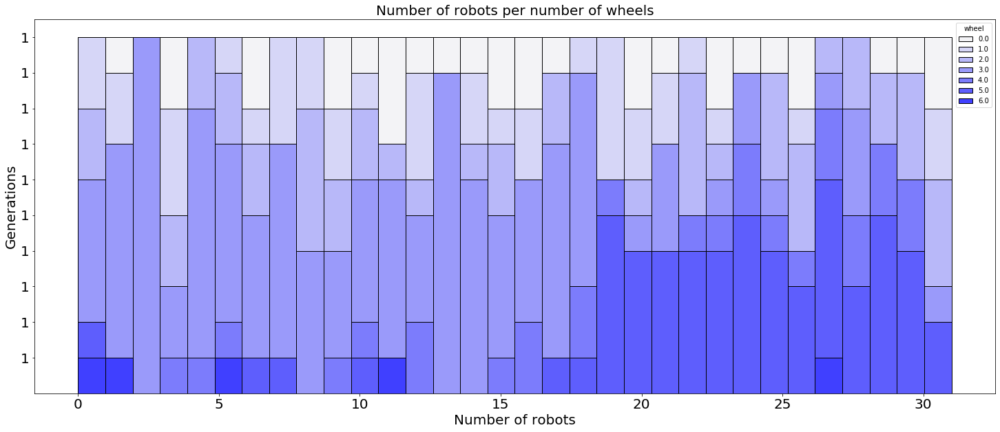

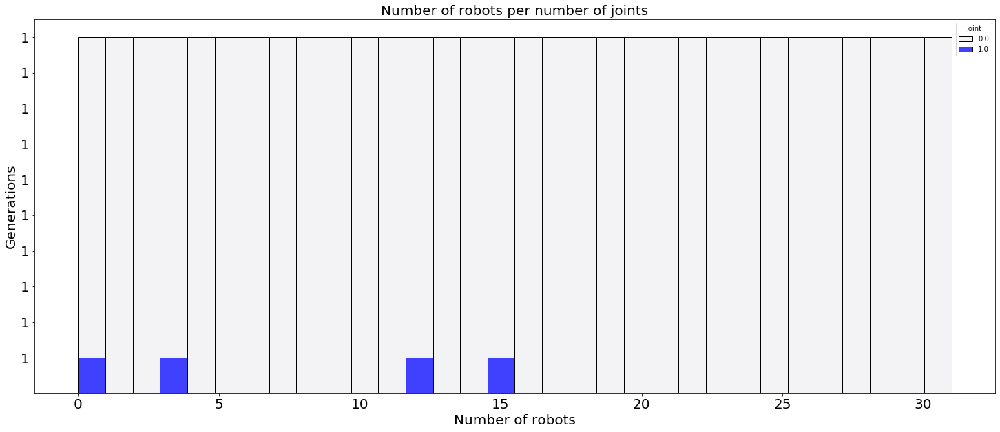

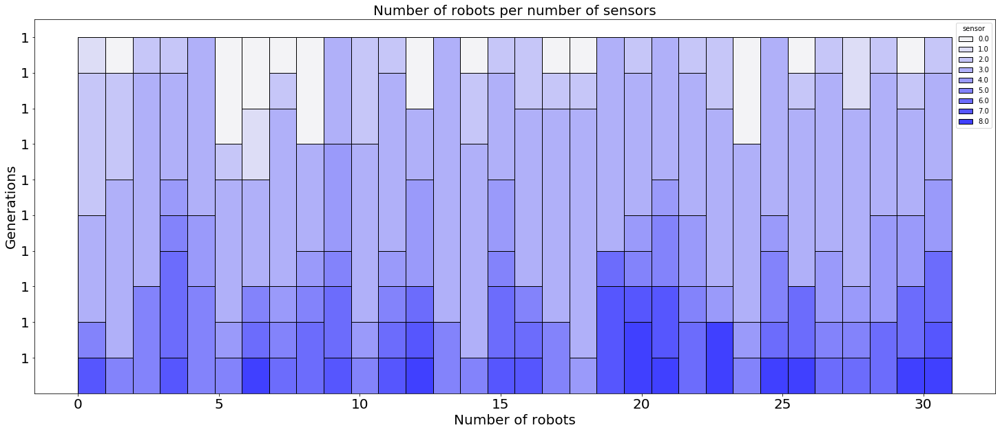

In [77]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [110]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

19
63
51
52
14


In [79]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [80]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [111]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

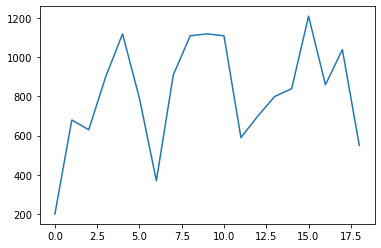

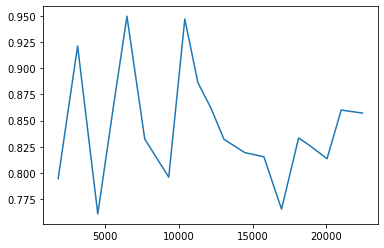

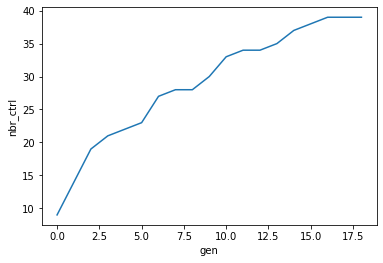

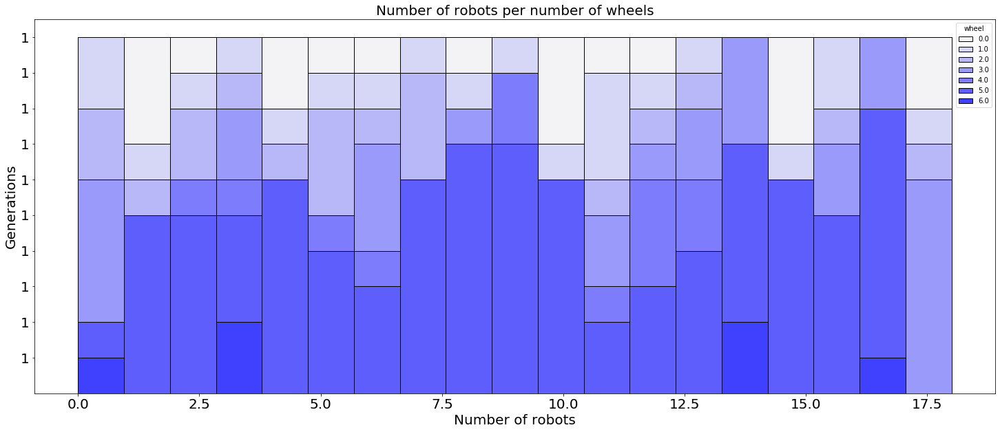

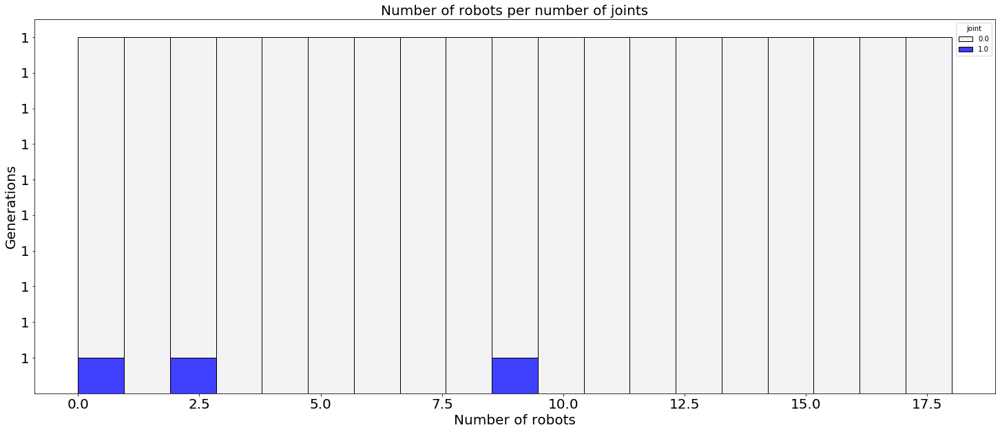

...

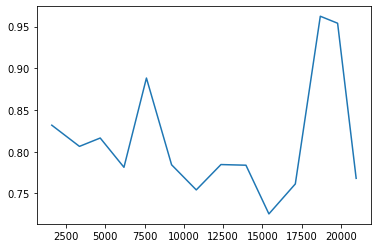

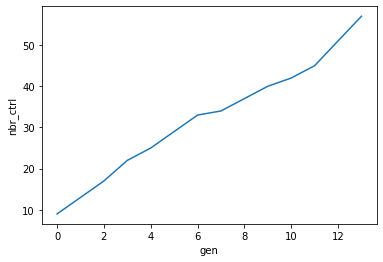

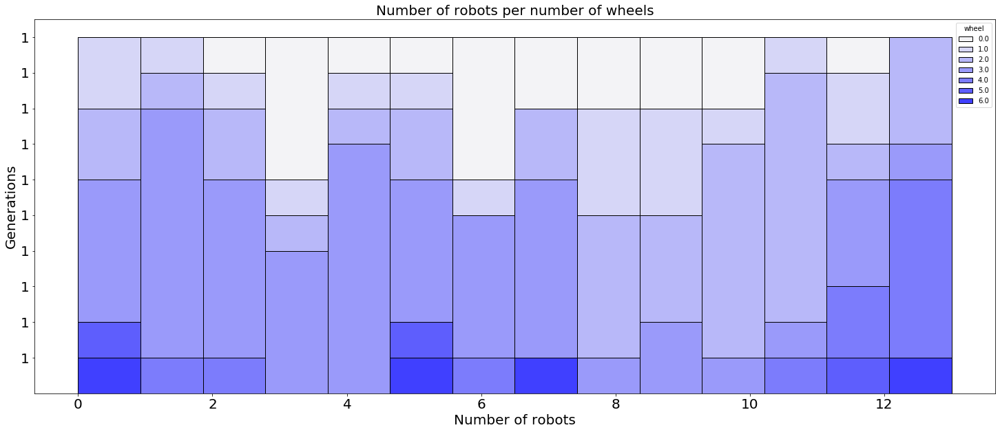

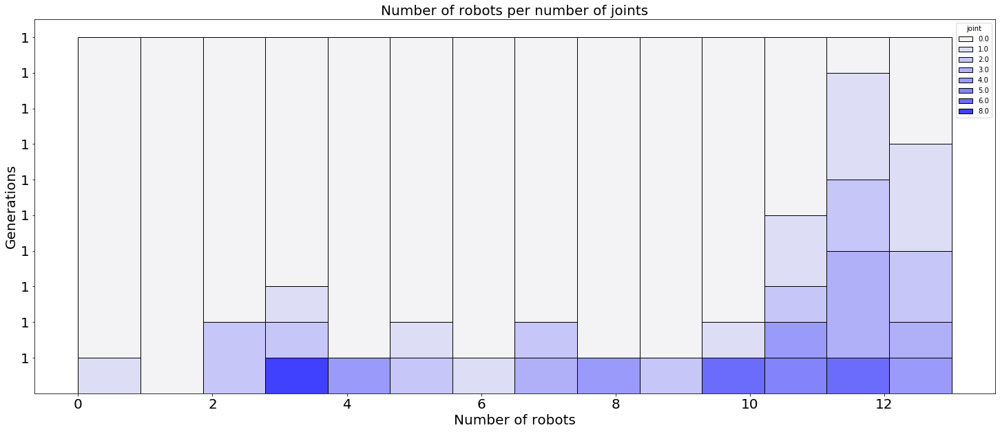

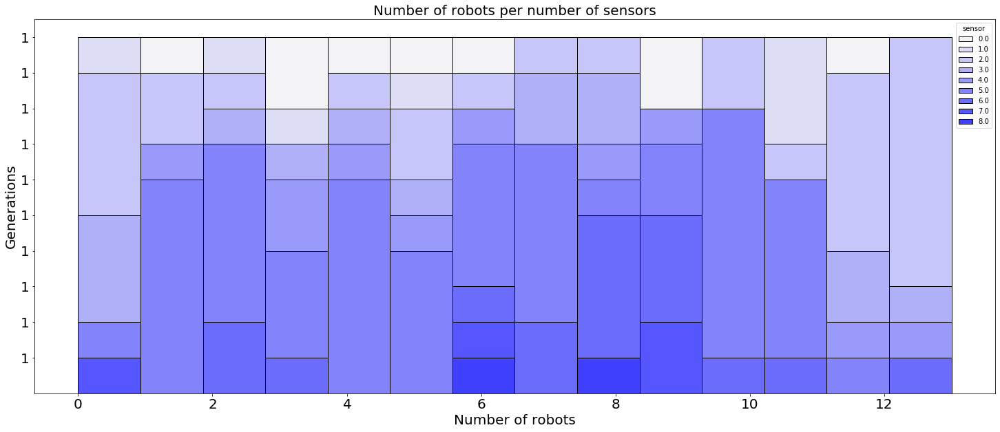

In [82]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [112]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["with archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

21
44
25
45
19


In [84]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [85]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [113]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["with archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

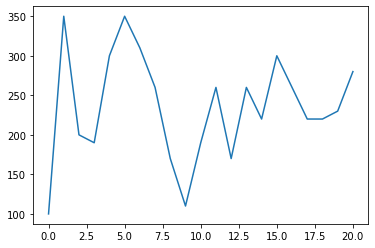

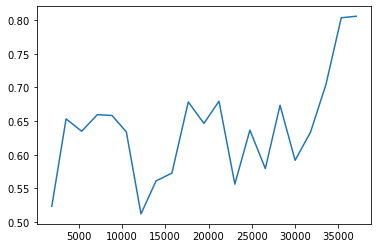

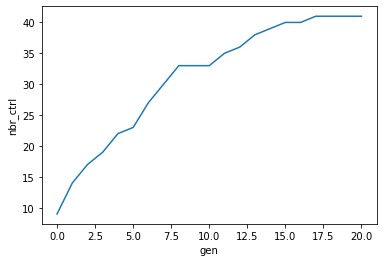

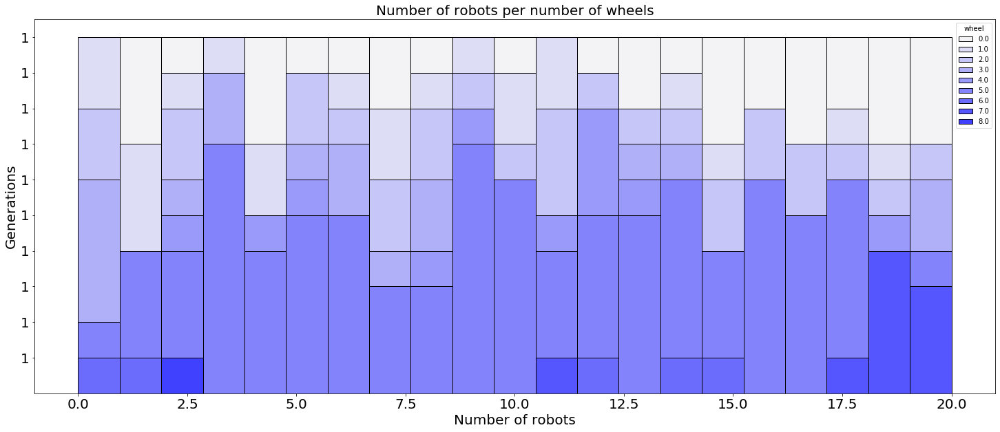

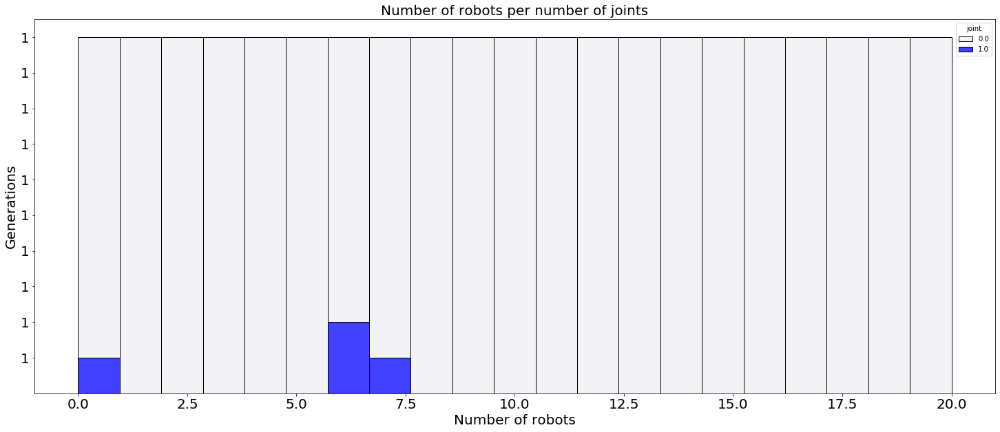

...

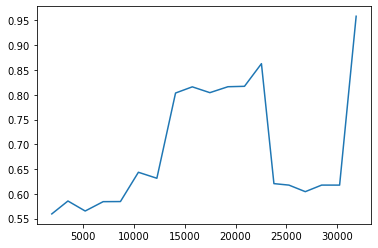

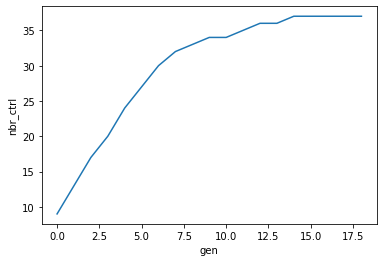

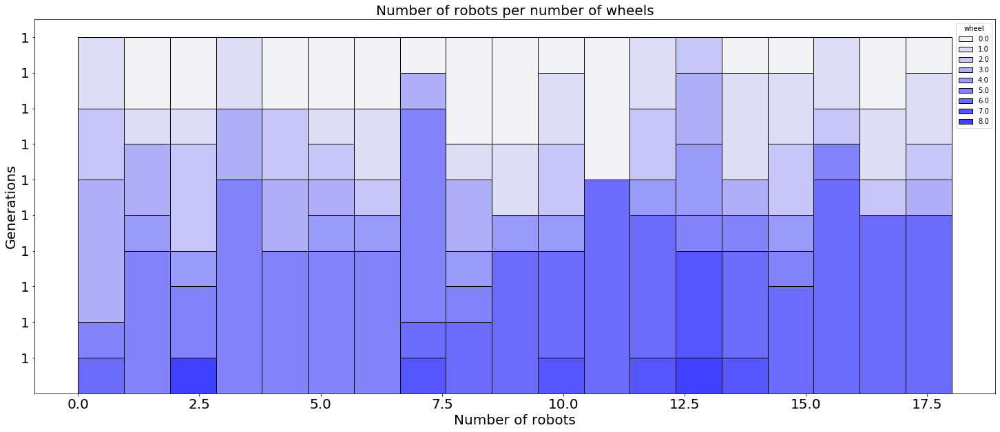

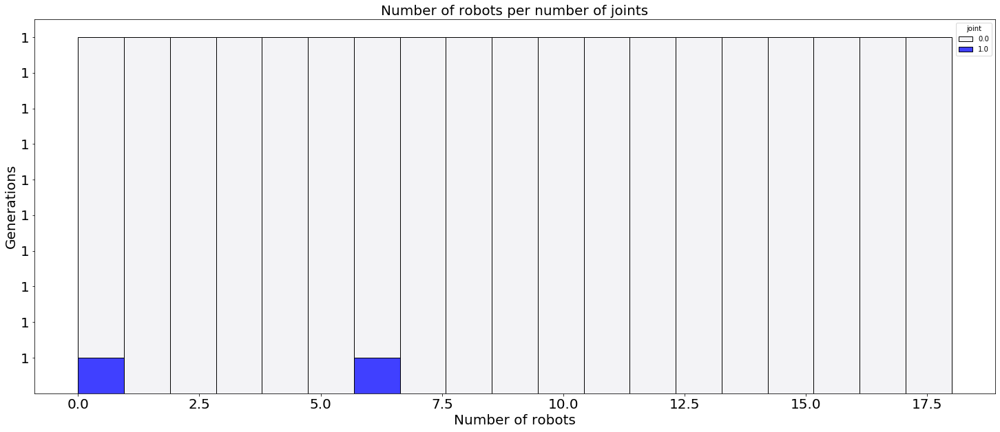

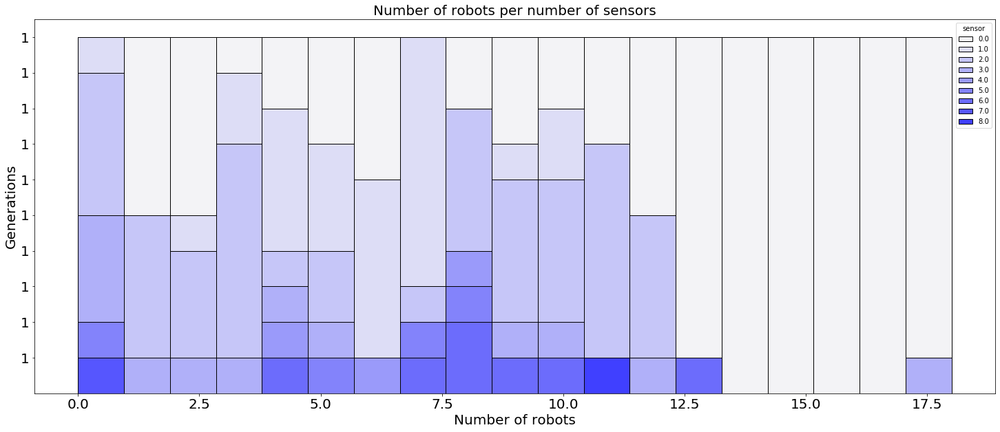

In [87]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [47]:
exp_folder = "/home/leni/are-logs/mnipes_forth/withca/hard/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    #nocap_v_wcap.append(["with archive","hard",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

19
34
32
31
49
40
29
39
17
40
28


In [48]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [49]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [50]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    #speedup_nvw.append(["no archive","hard",max(speedup[-1]),np.mean(speedup[-1])])

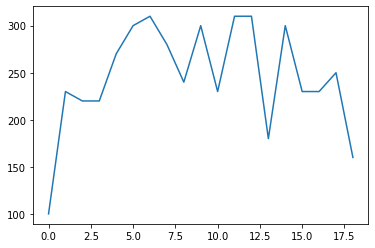

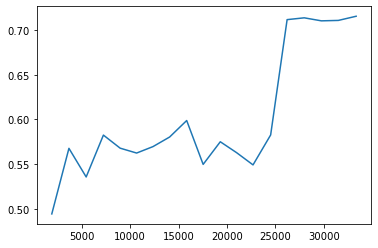

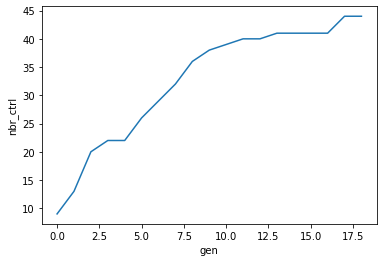

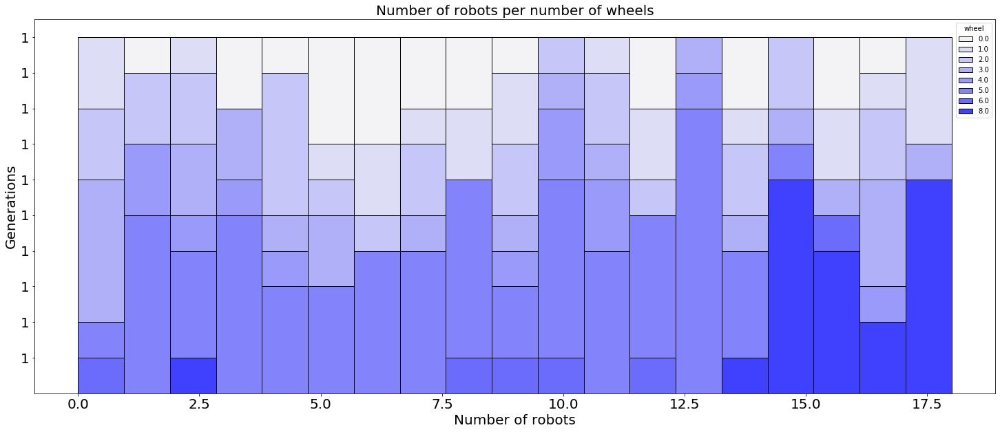

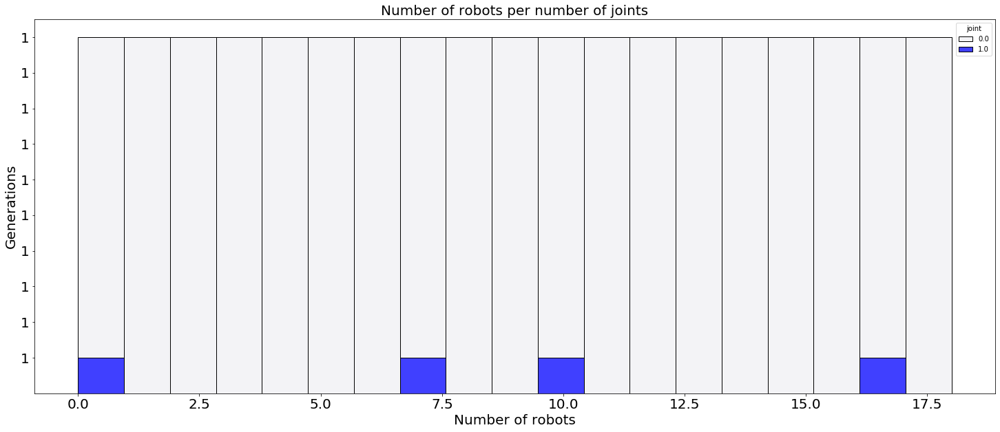

...

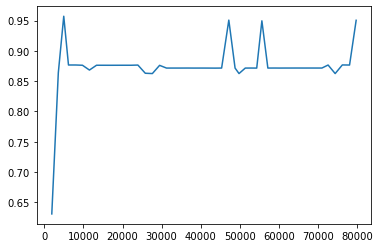

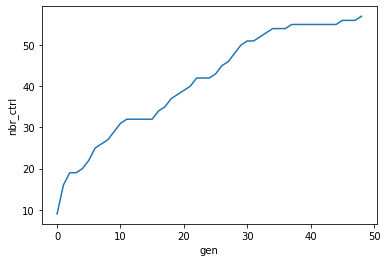

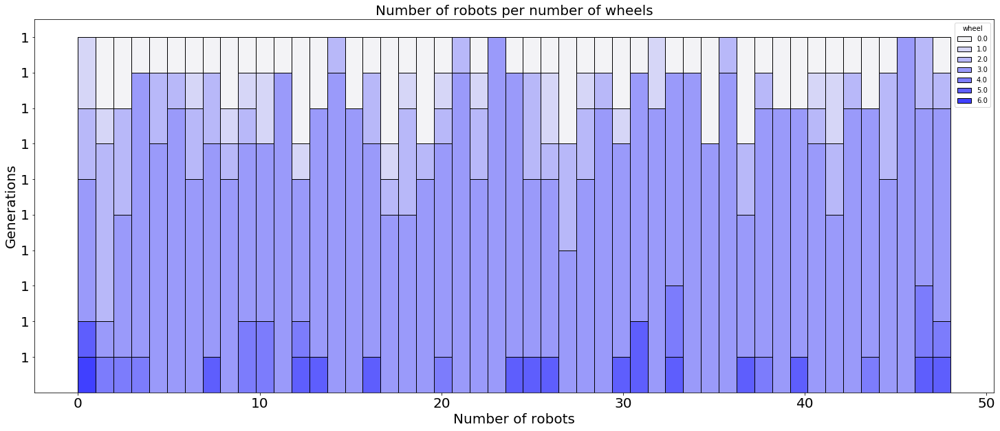

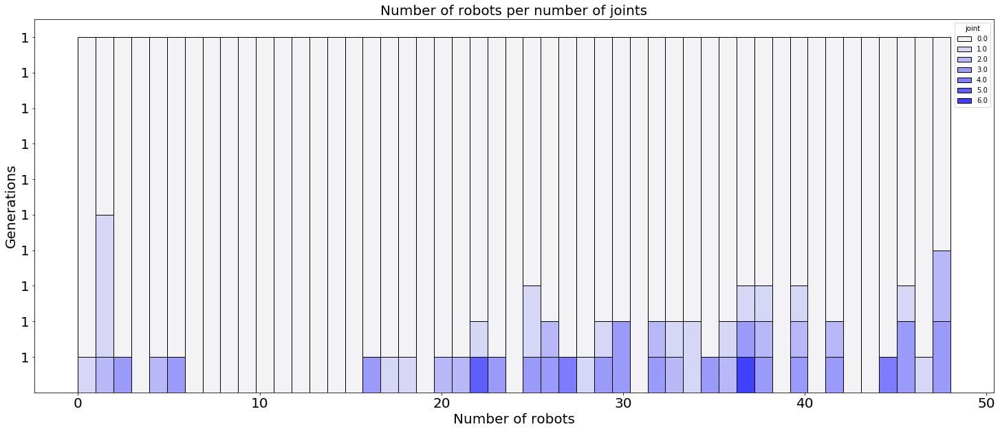

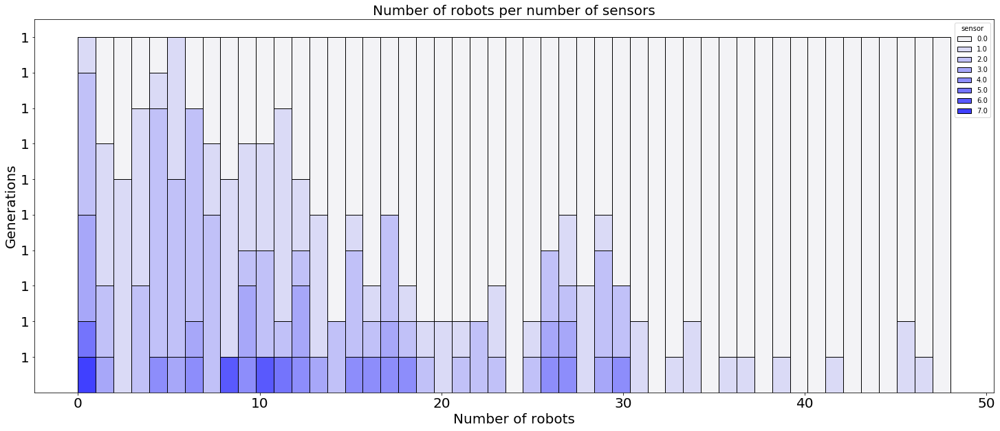

In [51]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [114]:
exp_folder = "/home/leni/are-logs/mnipes_forth/noca/arena/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","arena",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

61
44
74
52
56


In [89]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [115]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","arena",max(speedup[-1]),np.mean(speedup[-1])])

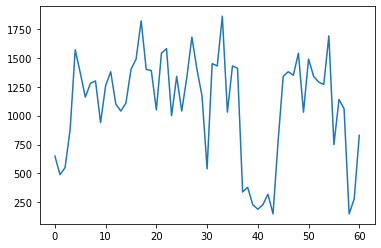

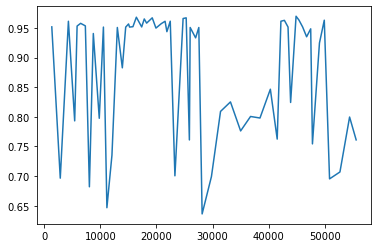

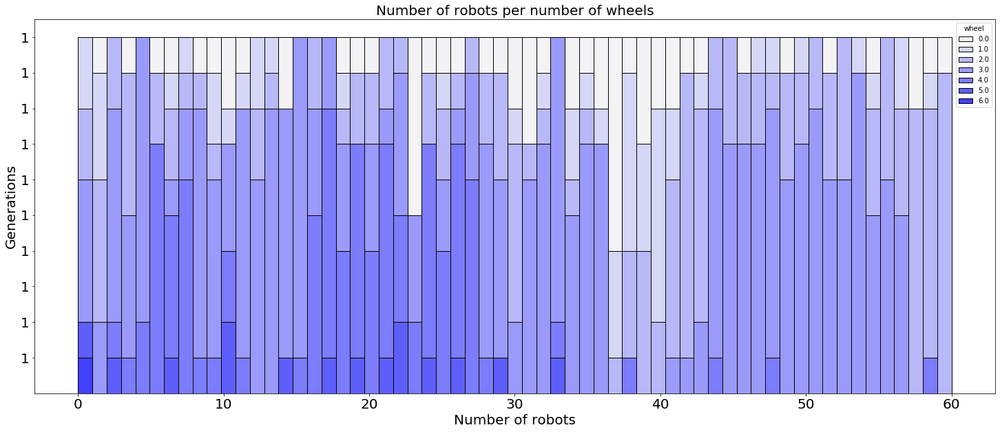

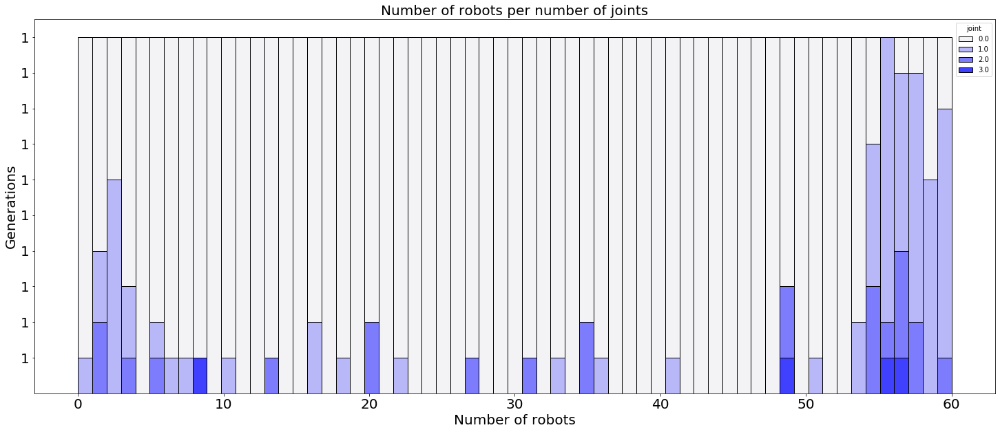

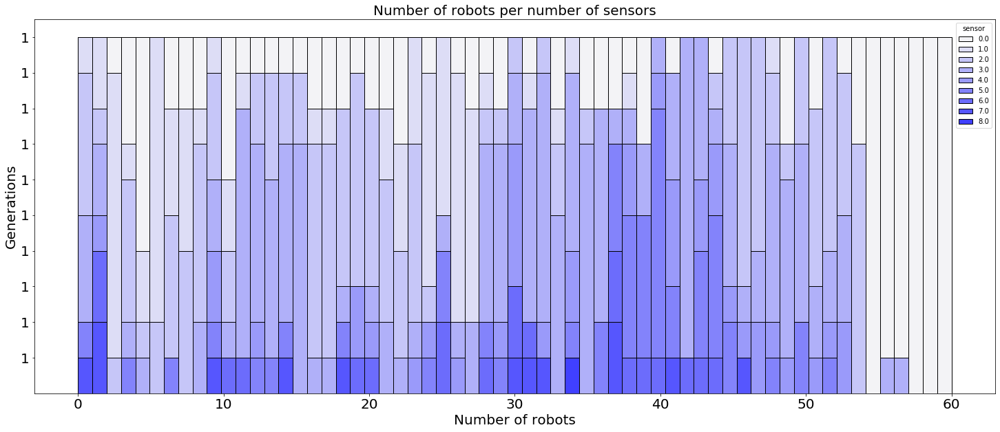

...

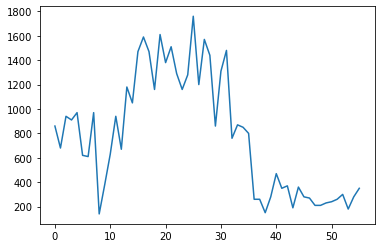

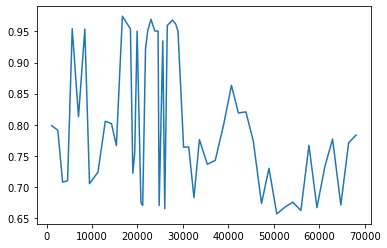

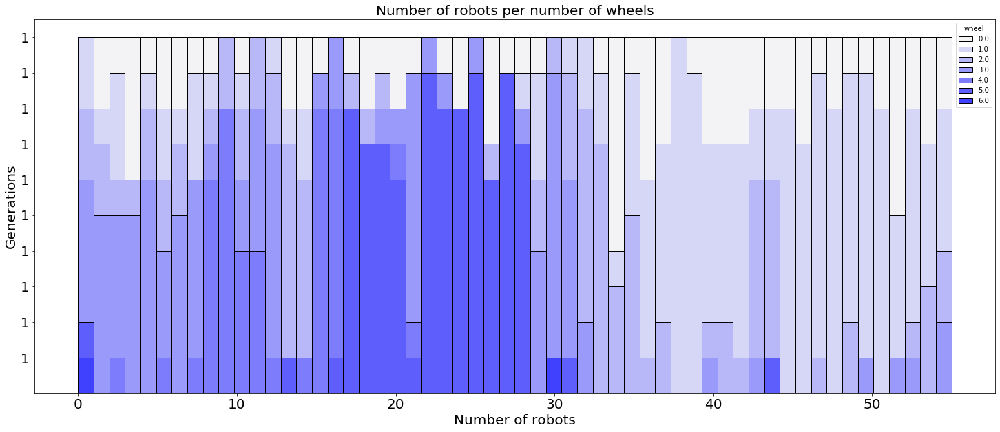

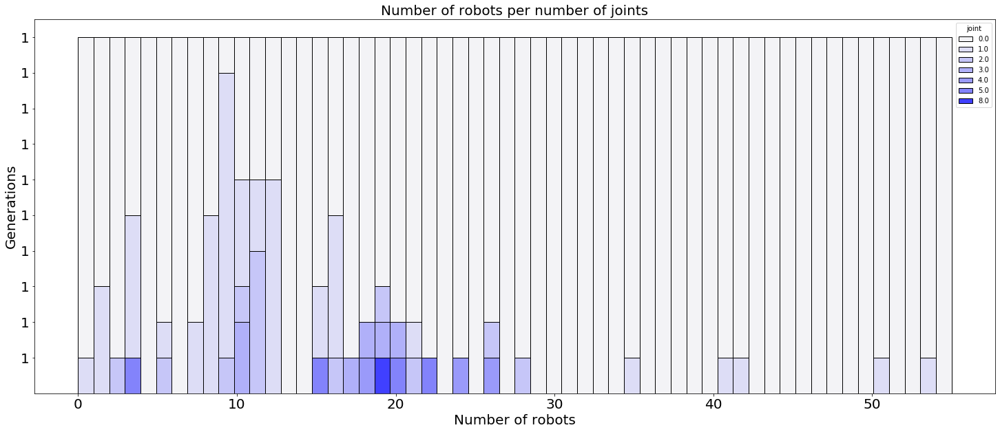

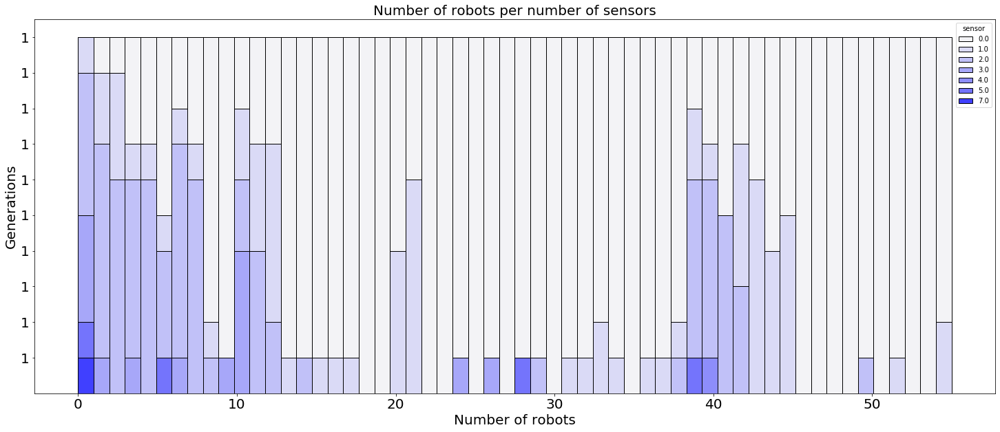

In [91]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [116]:
exp_folder = "/home/leni/are-logs/mnipes_forth/noca/escape/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","escape",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

59
21
53
25
55


In [93]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [117]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","escape",max(speedup[-1]),np.mean(speedup[-1])])

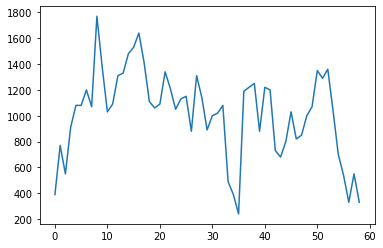

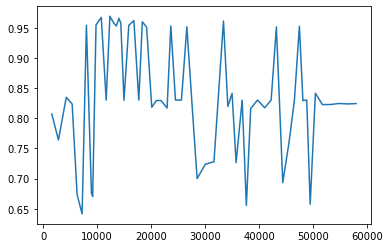

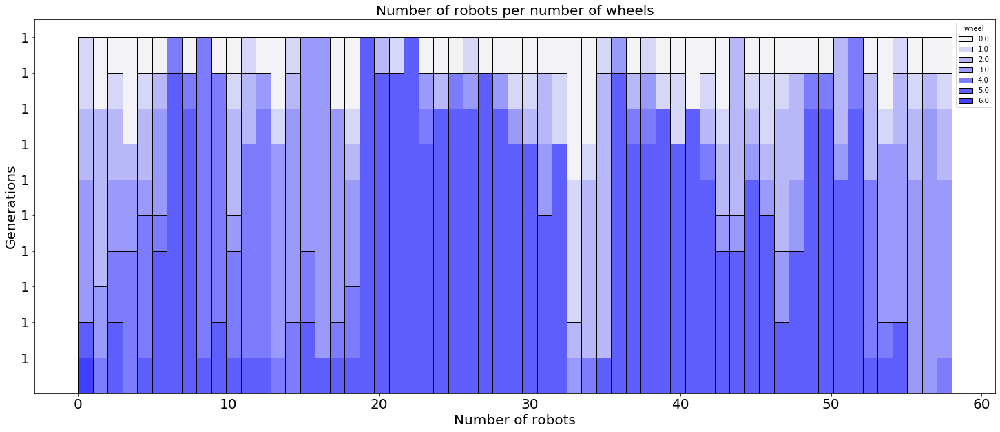

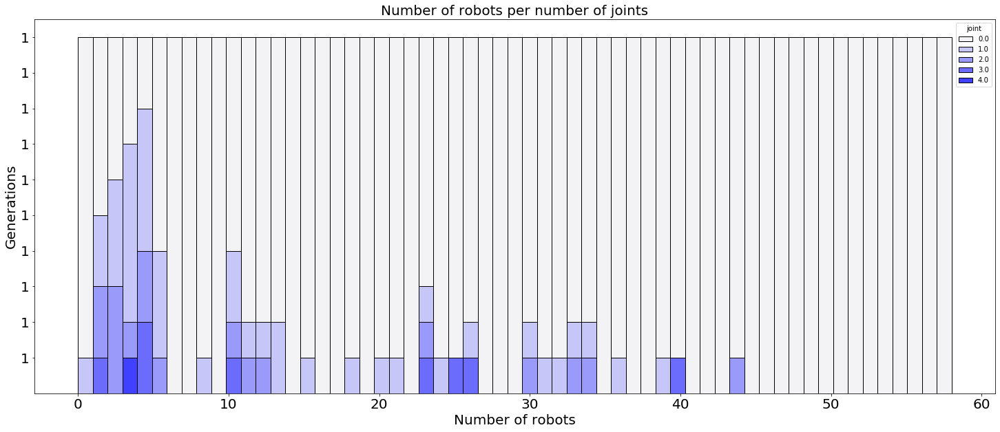

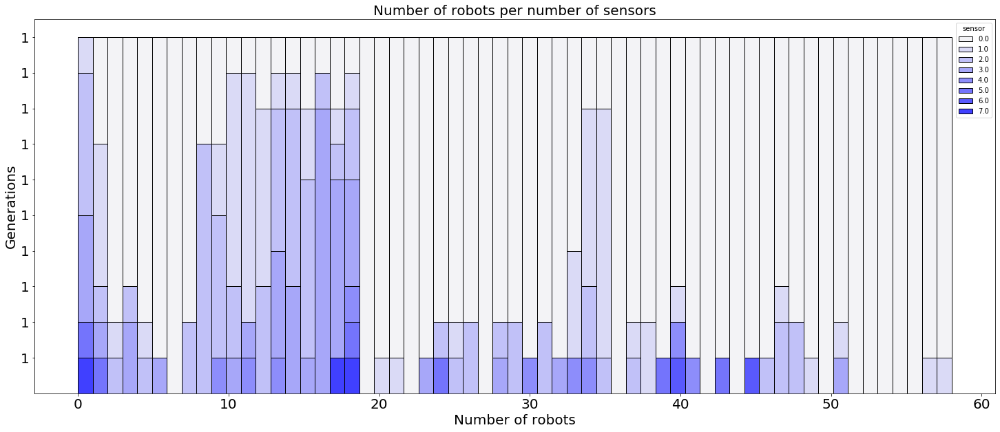

...

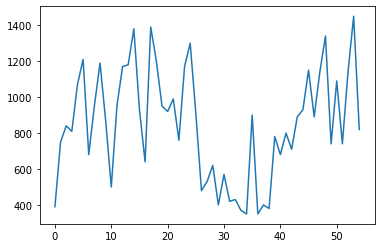

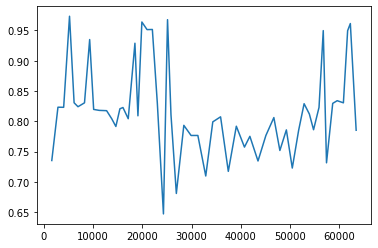

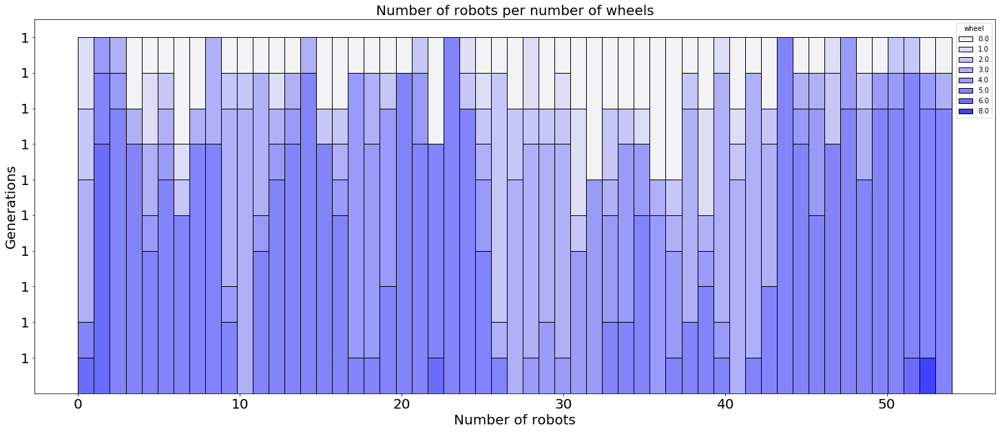

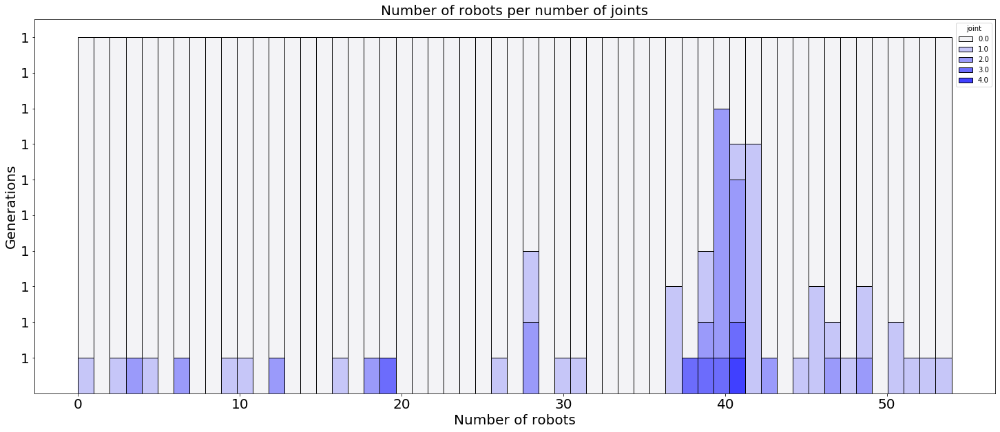

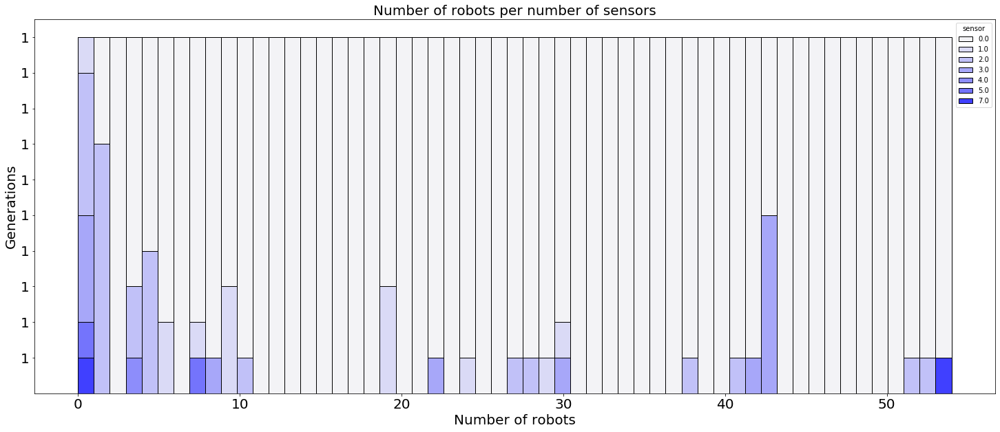

In [95]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [118]:
exp_folder = "/home/leni/are-logs/mnipes_forth/noca/easy/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)
    nocap_v_wcap.append(["no archive","easy",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])

29
31
22
23
36
20
47
34
47
36


In [97]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [119]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)
    speedup_nvw.append(["no archive","easy",max(speedup[-1]),np.mean(speedup[-1])])

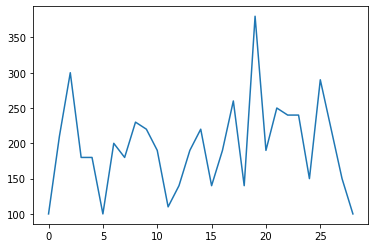

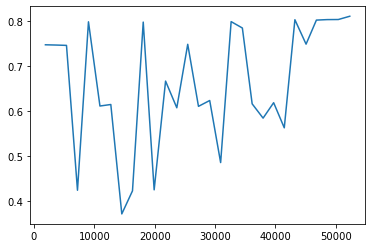

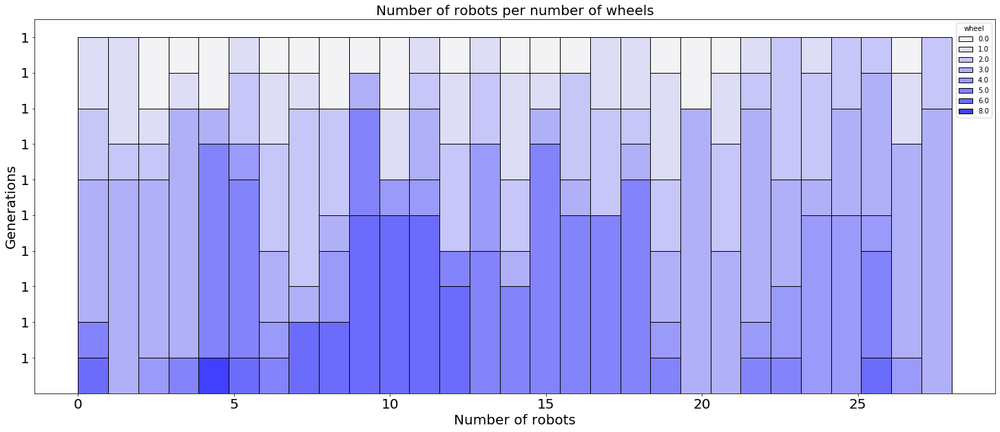

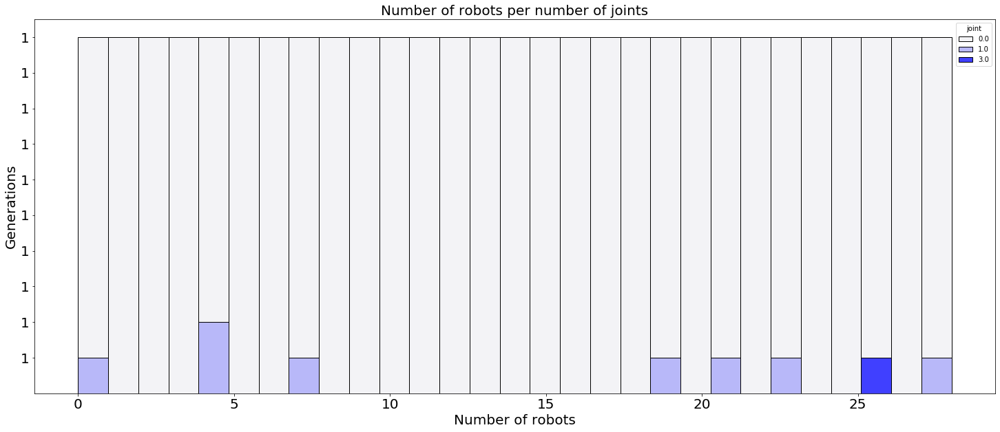

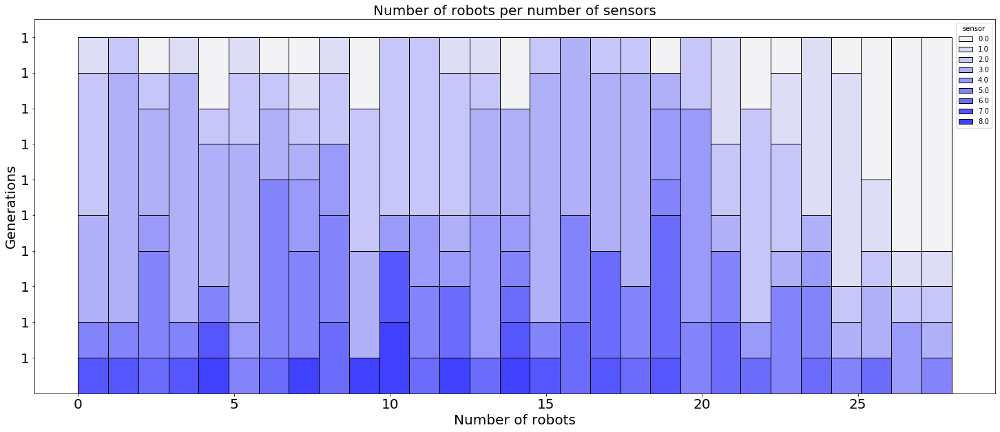

...

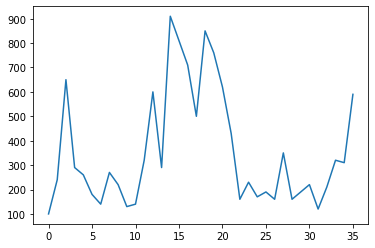

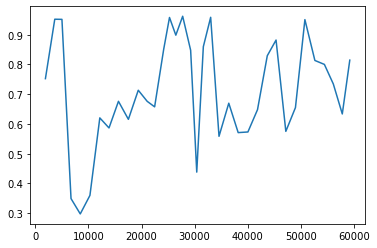

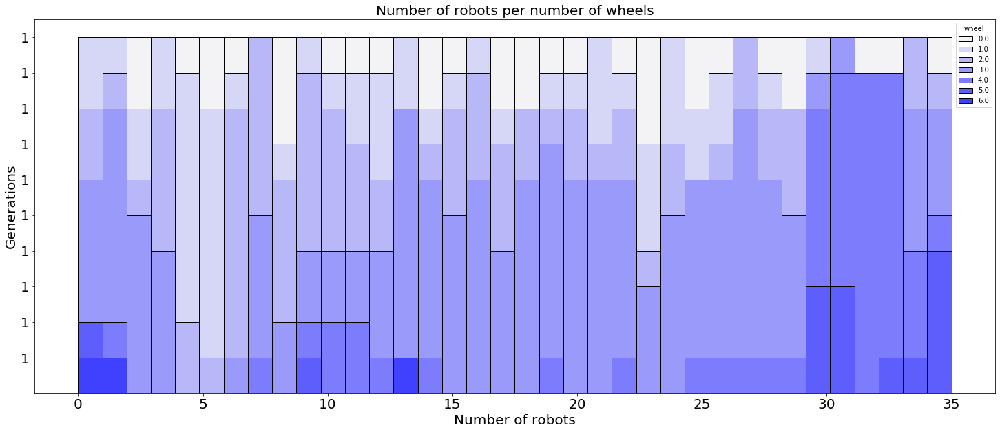

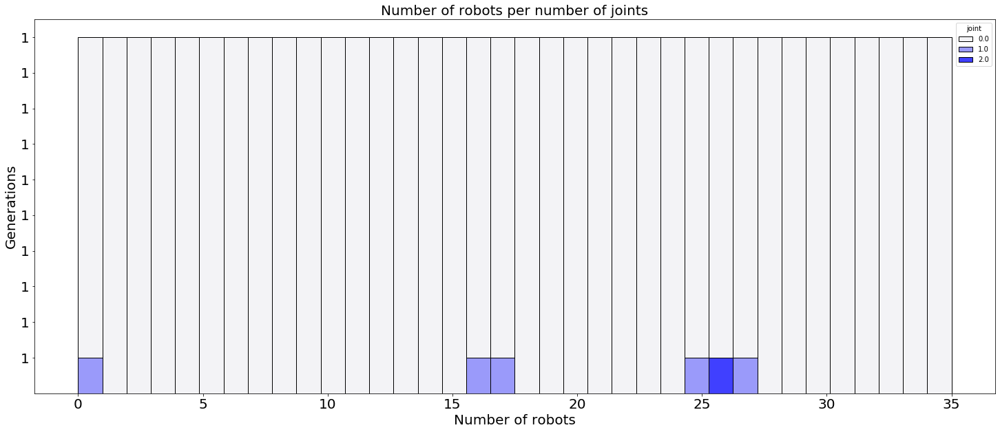

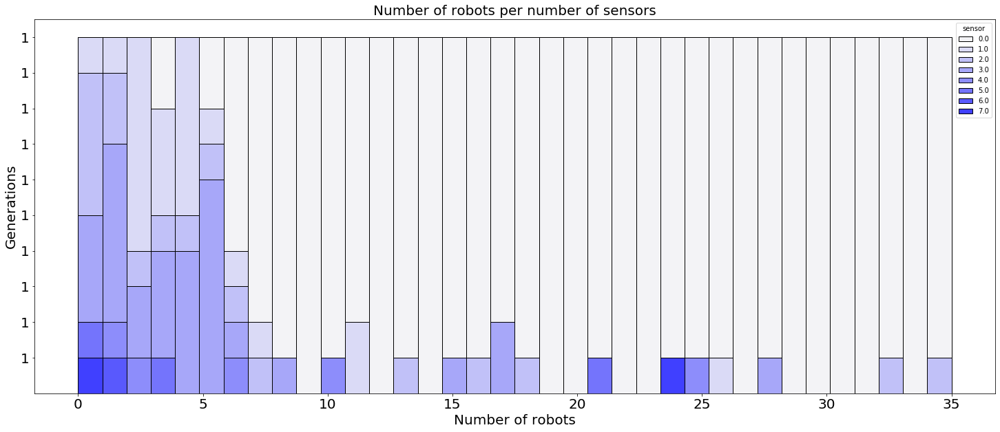

In [99]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel')
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint')
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor')

In [120]:
ca_data = pd.DataFrame(data=nocap_v_wcap,columns=["alg","env","max best fit","max avg fit","avg best fit","avg avg fit"])
speed_data = pd.DataFrame(data=speedup_nvw,columns=["alg","env","max speed up","avg speed up"])

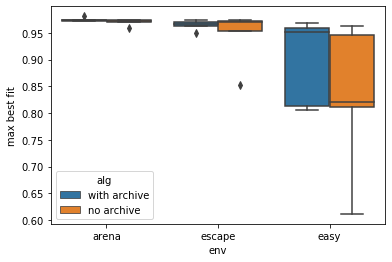

In [121]:
sns.boxplot(data=ca_data,x="env",y="max best fit",hue="alg")

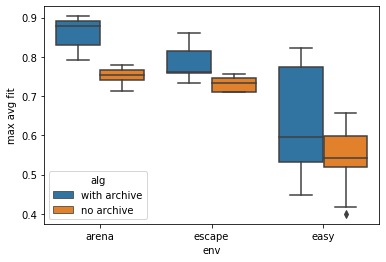

In [122]:
sns.boxplot(data=ca_data,x="env",y="max avg fit",hue="alg")

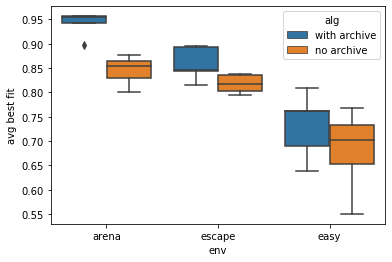

In [123]:
sns.boxplot(data=ca_data,x="env",y="avg best fit",hue="alg")

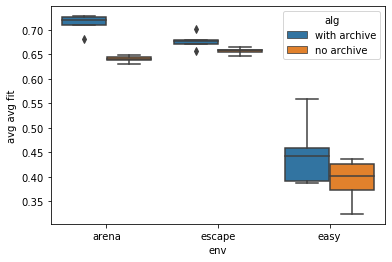

In [124]:
sns.boxplot(data=ca_data,x="env",y="avg avg fit",hue="alg")

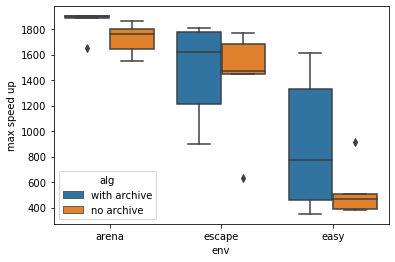

In [125]:
sns.boxplot(data=speed_data,x="env",y="max speed up",hue="alg")

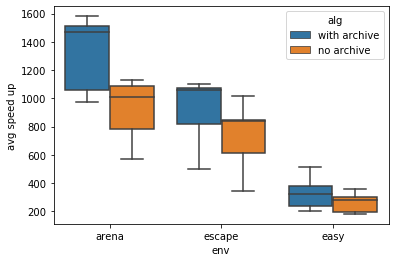

In [126]:
sns.boxplot(data=speed_data,x="env",y="avg speed up",hue="alg")

In [167]:
nocap_v_wcap = []
speedup_nvw = []

In [168]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/bf/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nocap_v_wcap.append(["best fitness",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    speedup_nvw.append(["best fitness",max(speedup),np.mean(speedup)])
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

23
22
29
22
21
19
19
20


In [126]:
lines = []
for folder in os.listdir(exp_folder):
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
morph_data = pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"])

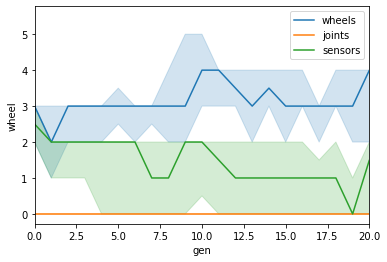

In [127]:
ax = sns.lineplot(data=morph_data,x="gen",y="wheel",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="joint",estimator=np.median,ci=100)
sns.lineplot(data=morph_data,x="gen",y="sensor",estimator=np.median,ci=100)
ax.set_xlim([0,20])
ax.legend(["wheels","joints","sensors"])

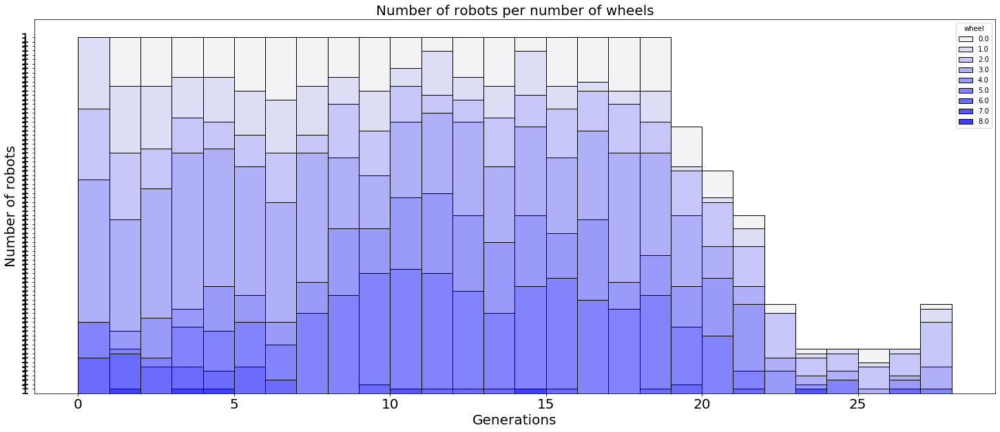

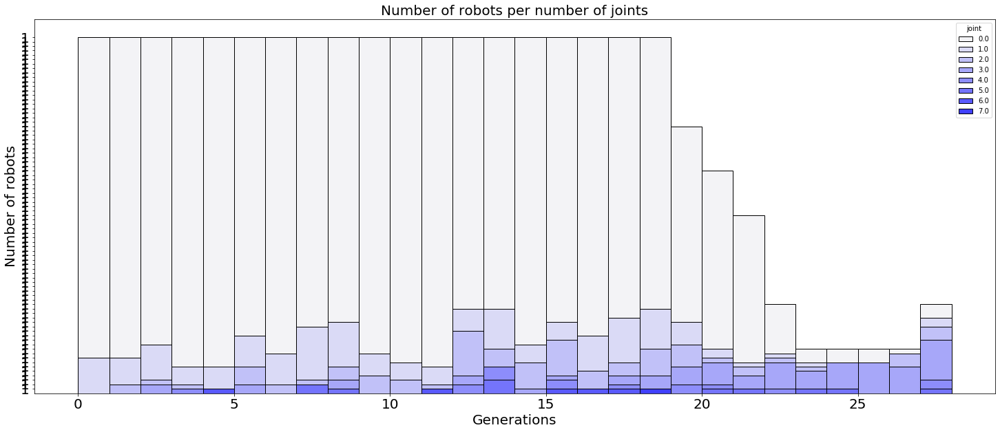

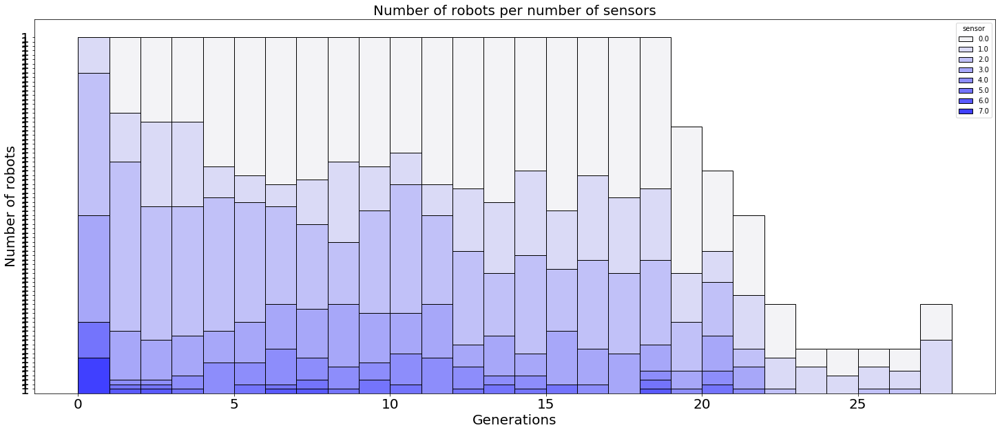

In [134]:
plot_hist_nbr_rob("Number of robots per number of wheels",morph_data,'wheel',28,80)
plot_hist_nbr_rob("Number of robots per number of joints",morph_data,'joint',28,80)
plot_hist_nbr_rob("Number of robots per number of sensors",morph_data,'sensor',28,80)

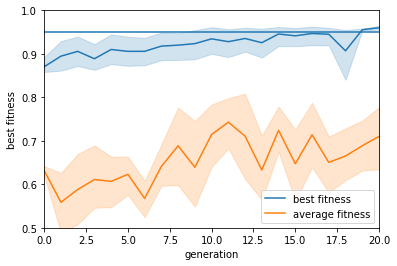

In [77]:
ax = sns.lineplot(data=data,x="generation",y="best fitness")
ax = sns.lineplot(data=data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.5,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-400, 700)

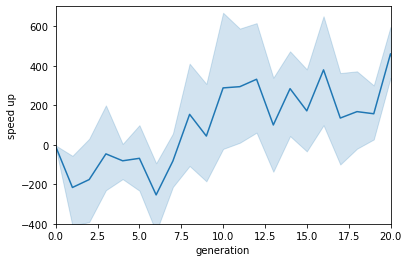

In [70]:
ax = sns.lineplot(data=data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-400,700])

(9, 50)

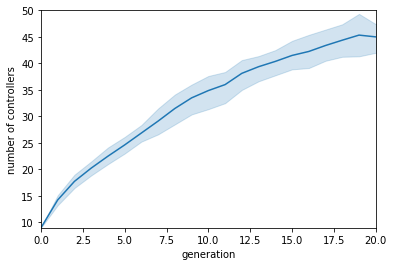

In [67]:
ax = sns.lineplot(data=data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
ax.set_ylim([9,50])

In [169]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/af/"
lines = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    best_fit = load_controllers_fitnesses(exp_folder+folder,len(best_fit))
    best_fit = [max(f) for f in best_fit]
    nocap_v_wcap.append(["average fitness",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    speedup_nvw.append(["average fitness",max(speedup),np.mean(speedup)])
    nbr_ctrl_v = []
    gen_v = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen_v.append(float(file.split("archive")[-1]))
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        nbr_ctrl_v.append(nbr_ctrl)
    nbr_ctrl_v = [nbr_ctrl_v[i] for i in np.argsort(gen_v)]
    for gen, bf, af, su,nc in zip(range(len(best_fit)),best_fit,avg_fit,speedup,nbr_ctrl_v):
        lines.append([gen,bf,af,su,nc])
data = pd.DataFrame(data=lines,columns=["generation","best fitness","average fitness","speed up","number of controllers"])

19
13
21
11
19
28
15
19


In [ ]:
ax = sns.lineplot(data=data,x="generation",y="best fitness")
ax = sns.lineplot(data=data,x="generation",y="average fitness")
ax.set_xlim([0,20])
ax.set_ylim([0.4,1])
ax.axhline([0.95])
plt.legend(["best fitness","average fitness"])

(-450, 0)

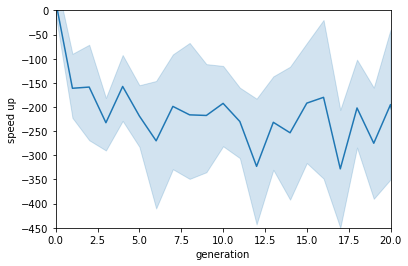

In [89]:
ax = sns.lineplot(data=data,x="generation",y="speed up")
ax.set_xlim([0,20])
ax.set_ylim([-450,0])

(9, 50)

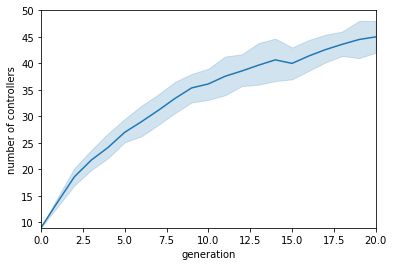

In [86]:
ax = sns.lineplot(data=data,x="generation",y="number of controllers")
ax.set_xlim([0,20])
ax.set_ylim([9,50])

In [170]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/lp/"
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    best_fit = load_controllers_fitnesses(exp_folder+folder,len(best_fit))
    print(len(best_fit))
    best_fit = [max(f) for f in best_fit]
    nocap_v_wcap.append(["learning progress",max(best_fit),max(avg_fit),np.mean(best_fit),np.mean(avg_fit)])
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    theo_max = [2000]*len(nbr_eval)
    speedup = np.array(theo_max) - np.array(nbr_eval)
    speedup_nvw.append(["learning progress",max(speedup),np.mean(speedup)])
    

7
28
23
6
23
22
22
7


In [171]:
ca_data = pd.DataFrame(data=nocap_v_wcap,columns=["fitness","max best fit","max avg fit","avg best fit","avg avg fit"])
speed_data = pd.DataFrame(data=speedup_nvw,columns=["fitness","max speed up","avg speed up"])

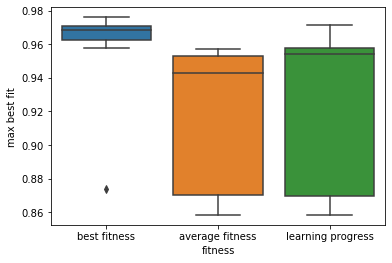

In [172]:
sns.boxplot(data=ca_data,x="fitness",y="max best fit")

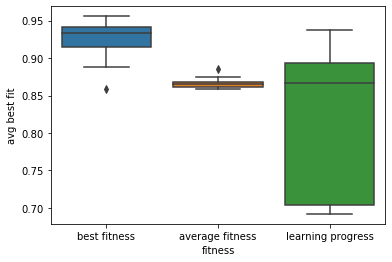

In [173]:
sns.boxplot(data=ca_data,x="fitness",y="avg best fit")

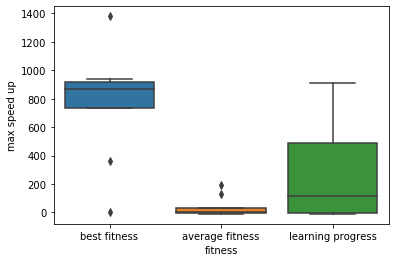

In [174]:
sns.boxplot(data=speed_data,x="fitness",y="max speed up")

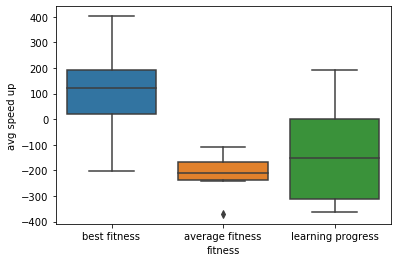

In [175]:
sns.boxplot(data=speed_data,x="fitness",y="avg speed up")

In [120]:
exp_folder = "/home/leni/are-logs/mnipes_fifth_hard_fit_fcts/bf/"
best_fits = []
avg_fits = []
neval_per_gen = []
for folder in os.listdir(exp_folder):
    neval, best_ids, best_fit, avg_fit, pop_size = load_all_fitnesses(exp_folder + folder + "/fitnesses.csv",0)
    print(len(best_fit))
    nbr_eval = load_number_of_eval_per_gen(exp_folder + folder,len(best_fit))
    best_fits.append(best_fit)
    avg_fits.append(avg_fit)
    neval_per_gen.append(nbr_eval)

23
22
29
22
21
19
19
20


In [121]:
morph_data=[]
for folder in os.listdir(exp_folder):
    lines = []
    descriptors = load_descriptor(exp_folder + folder + "/MD_Cart_WDH.csv",8)
    for desc in descriptors:
        lines.append([desc[0],str(desc[1]),desc[6]*16,desc[7]*16,desc[8]*16])
    morph_data.append(pd.DataFrame(data=lines,columns=["gen","robot","wheel","sensor","joint"]))

In [48]:
dataframes=[]
for folder in os.listdir(exp_folder):
    lines = []
    for file in os.listdir(exp_folder + folder):
        if(file.split("_")[0] != "controller"):
            continue
        gen = float(file.split("archive")[-1])
        ctrl_arch = load_controller_archive(exp_folder + folder + "/" + file)
        nbr_ctrl=0
        for i,line in ctrl_arch.iterrows():
            if(line["fitness"] > 0):
                nbr_ctrl+=1
        lines.append([gen,nbr_ctrl])
    dataframes.append(pd.DataFrame(data=lines,columns=["gen","nbr_ctrl"]))

In [122]:
speedup = []
neval = []
for i in range(5):
    theo_max = [2000]*len(neval_per_gen[i])
    cumul_neval = neval_per_gen[i]    
    speedup.append(np.array(theo_max) - np.array(neval_per_gen[i]))
    for j in range(len(neval_per_gen[i])-1):
        cumul_neval[j+1]+=cumul_neval[j]
    neval.append(cumul_neval)

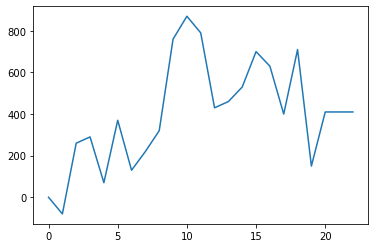

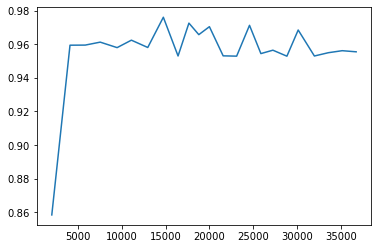

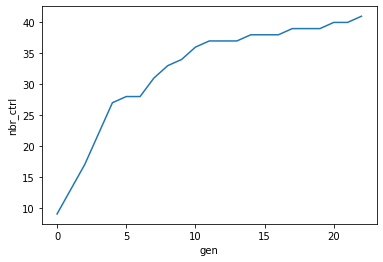

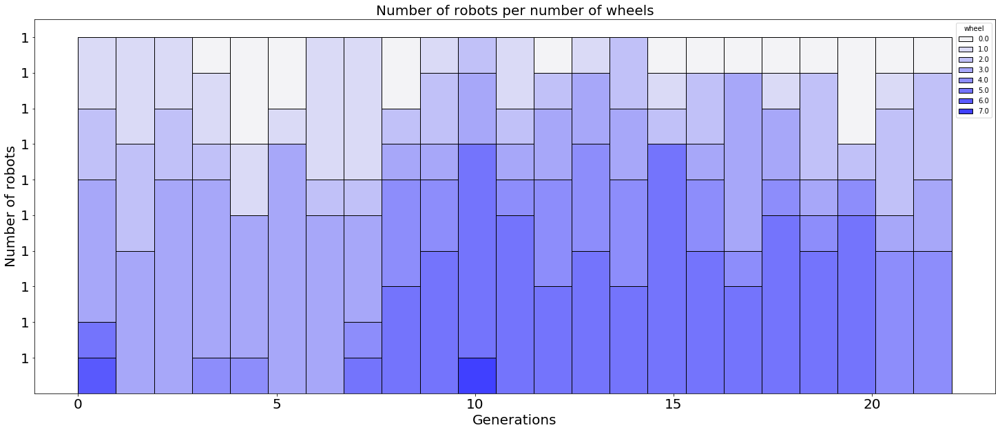

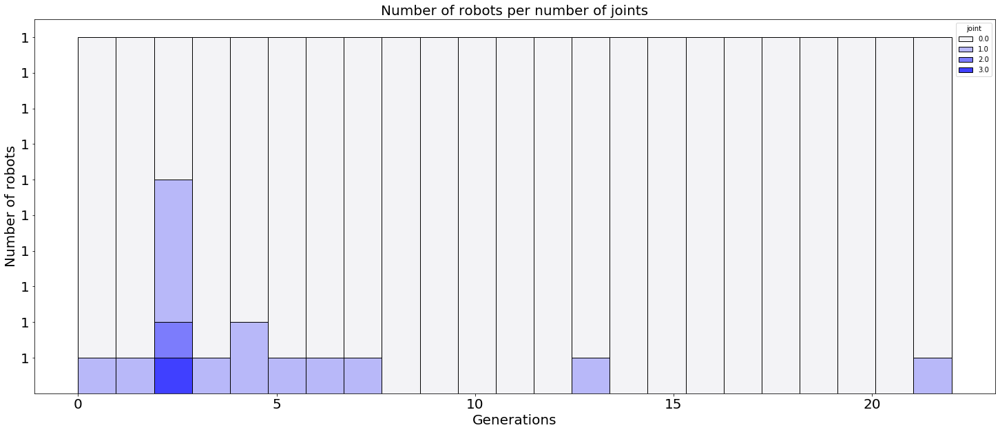

...

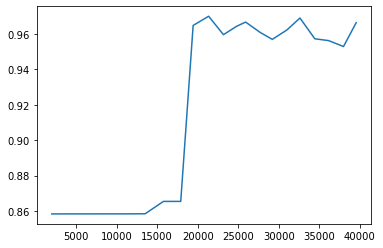

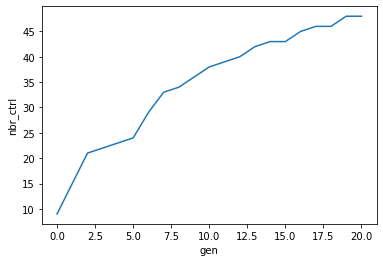

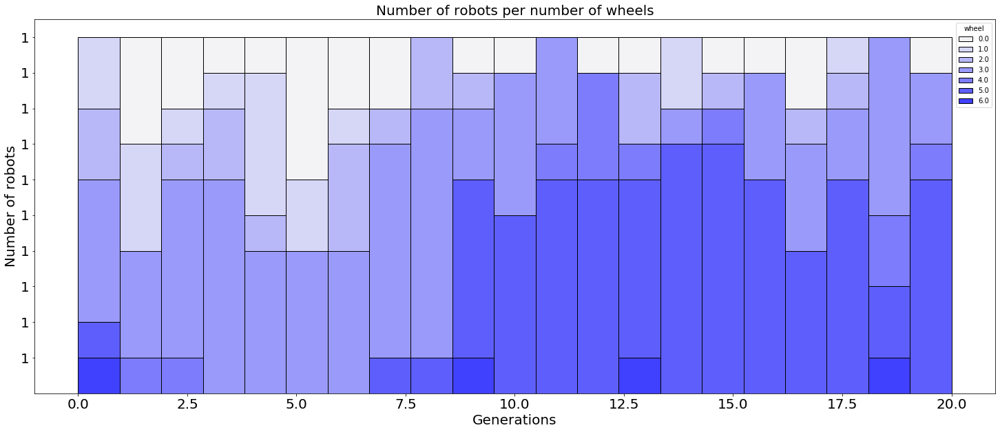

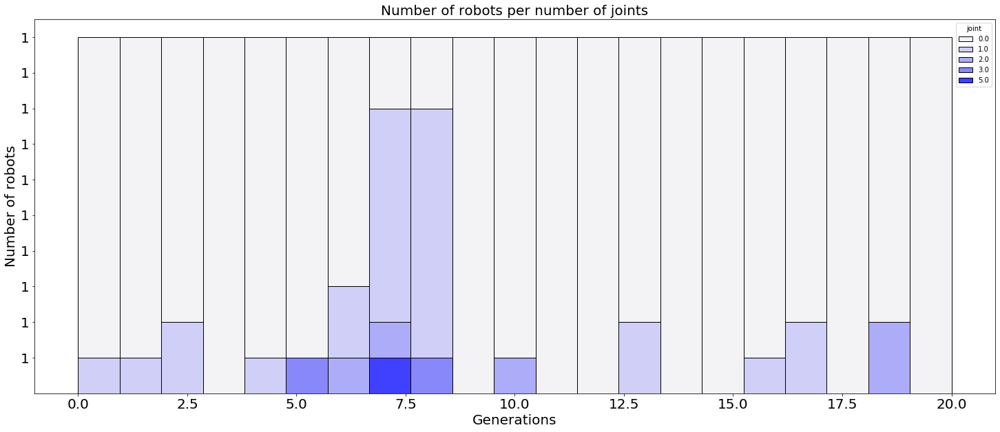

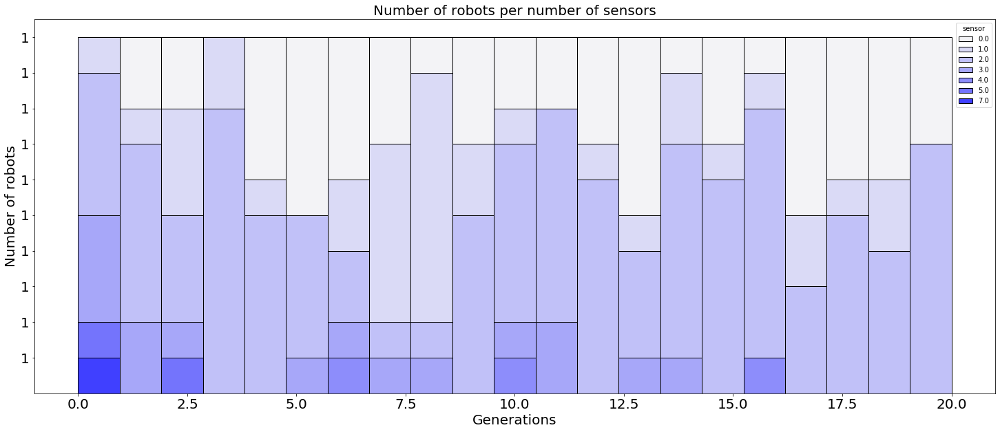

In [123]:
for i in range(5):
    plt.plot(speedup[i])
    plt.show()
    plt.plot(neval[i],best_fits[i])
    plt.show()
    sns.lineplot(data=dataframes[i],x='gen',y='nbr_ctrl')
    plt.show()
    plot_hist_nbr_rob("Number of robots per number of wheels",morph_data[i],'wheel',len(best_fits[i]))
    plot_hist_nbr_rob("Number of robots per number of joints",morph_data[i],'joint',len(best_fits[i]))
    plot_hist_nbr_rob("Number of robots per number of sensors",morph_data[i],'sensor',len(best_fits[i]))